In [1]:
%matplotlib widget

import seaborn as sns
sns.set_theme()
sns.set_context('talk')
sns.set(font_scale=1)

import os
from pathlib import Path

import matplotlib.pyplot as plt
from matplotlib import gridspec
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib.widgets import RectangleSelector
from matplotlib.colors import LogNorm

import numpy as np
import pandas as pd

import xrayutilities as xu
from silx.io.specfile import SpecFile,Scan
import pyFAI
import pyFAI.detectors as detectors
import fabio

import ipywidgets as widgets
from ipywidgets import interact, fixed, VBox, HBox
from IPython.display import display

from joblib import Parallel, delayed
from multiprocessing import cpu_count

from natsort import natsorted, os_sorted
from collections import OrderedDict
from functools import reduce

import pickle

import warnings
warnings.filterwarnings('ignore')

AA = '\mathrm{\AA}^{-1}'
cmap='magma'

## Functions

In [2]:
def read_image(file, shape=(195, 487), dtype='int32', header_skip=4096, flip=False):
    """
    Generic function to read edf, TIFF and RAW files. Assumes specific structure.
    TIFF files have a header to skip, RAW files don't.
    """
    ext = os.path.splitext(str(file))[1][1:].lower()
    if ext == 'edf':
        with fabio.open(file) as f:
            arr = f.data.astype(float)
        mask = detectors.Pilatus300k().get_mask()
        arr[mask == True] = np.NaN
        if flip:
            arr = np.fliplr(arr.T)
            #arr = arr.T
        return arr

    try:
        with open(file, 'rb') as im:
            if os.path.splitext(str(file))[1][1:] in ['tif', 'tiff']:
                im.seek(header_skip)
            arr = np.frombuffer(im.read(), dtype=dtype)
            arr = arr.reshape(shape)
        if flip:
            arr = np.fliplr(arr)
        return arr.astype(float)
    except Exception as e:
        print(f"Error reading file: {file}, Error: {str(e)}")
        return None


def read_edf(file, flip=False):
    with fabio.open(file) as f:
        arr = f.data.astype(float)
    mask = detectors.Pilatus300k().get_mask()
    arr[mask==True] = np.NaN
    return np.fliplr(arr.T) if flip else arr


def read_tiff_or_raw(file, shape, dtype, header_skip, flip=False):
    with open(file, 'rb') as im:
        if os.path.splitext(file)[1][1:] in ['tif', 'tiff']:
            im.seek(header_skip)
        arr = np.frombuffer(im.read(), dtype=dtype).reshape(shape)
    return np.fliplr(arr) if flip else arr


def read_image(file, shape=(195, 487), dtype='int32', header_skip=4096, flip=False):
    extension = os.path.splitext(file)[1][1:]
    if extension == 'edf':
        return read_edf(file, flip)
    elif extension in ['tif', 'tiff', 'raw']:
        return read_tiff_or_raw(file, shape, dtype, header_skip, flip)
    else:
        raise ValueError(f"Unsupported file extension: {extension}")
    
    
def get_edf_header(file):
    """Extracts header information from an EDF file."""
    with fabio.open(file) as f:
        return f.header


def get_energy_and_UB(edf_file):
    header = get_edf_header(edf_file)
    energy = 12.398 / float(header['source_wavelength']) * 1e3
    UB = np.array(header['UB_pos'].split()).astype(float).reshape(3,3)
    
    return energy, UB


def get_scan_data(edf_file, angles_dict, flip=False):
    header = get_edf_header(edf_file)
    motors = {k:float(v) for k, v in zip(header['motor_mne'].split(), header['motor_pos'].split())}
    [angles_dict[dm].append(motors[dm]) for dm in angles_dict.keys()]
    
    return read_image(edf_file, flip=flip)


def get_img_arr(edf_files, parallel=True, flip=False):
    if parallel:
        with Parallel(n_jobs=min(cpu_count(), len(edf_files)), require='sharedmem') as parallel:
            img_arr = parallel(delayed(read_image)(f, flip=flip) for f in edf_files)
    else:
        img_arr = [read_image(f, flip=flip) for f in edf_files]
    return np.array(img_arr)


def get_scan_path_info(scan, base_path=None):
    rel_path = scans[scan]
    sample_name, scan_num = scan.split()
    scan_num = int(scan_num[1:])
    img_dir = base_path / rel_path
    
    return img_dir, sample_name, scan_num
    

def get_edf_files(scan, base_path=None):
    img_dir, sample_name, scan_num = get_scan_path_info(scan, base_path)
    return natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))


def get_edf_motors(edf_file):
    header = get_edf_header(edf_file)
    return {k:float(v) for k, v in zip(header['motor_mne'].split(), header['motor_pos'].split())}
    

def get_edf_counters(edf_file):
    header = get_edf_header(edf_file)
    return {k:float(v) for k, v in zip(header['counter_mne'].split(), header['counter_pos'].split())}
    

def get_scan_motors(edf_files):
    return pd.DataFrame([get_edf_motors(f) for f in edf_files])


def get_scan_counters(edf_files):
    return pd.DataFrame([get_edf_counters(f) for f in edf_files])


def load_stack(img_dir, sample_name, scan_num, parallel=True, flip=False, diff_motors=['eta', 'chi', 'phi', 'del']):
    """
    Loads a stack of images, applying parallelization if requested.
    """
    # Get edf files
    edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

    # Get energy and UB matrix
    energy, UB = get_energy_and_UB(edf_files[0])

    # Get motor positions from which the diff angles are extracted
    motors = get_scan_motors(edf_files)
    angles = [list(motors[m]) for m in diff_motors]

    # Get image stack
    img_arr = get_img_arr(edf_files, parallel=parallel, flip=flip)

    return img_arr, energy, UB, angles, get_edf_header(edf_files[0])


def grid_img_data(img, energy, UB, angles, header, bins=(200, 200, 200)):
    """
    Maps image data to reciprocal space, using a gridder for binning.
    """
    qconversion = xu.QConversion(['z-', 'y+', 'z-'], ['z-'], [0, 1, 0])
    hxrd = xu.HXRD([0, 1, 0], [0, 0, 1], geometry='real', en=energy, qconv=qconversion)

    Nch1, Nch2 = header['Dim_1'], header['Dim_2']
    cch1, cch2 = header['beam_x'], header['beam_y']
    pwidth1, pwidth2 = header['pixel_size_x'], header['pixel_size_y']
    distance = header['detector_distance']
    
    hxrd.Ang2Q.init_area('x-', 'z-', 
                         cch1=cch1, cch2=cch2, 
                         Nch1=Nch1, Nch2=Nch2,
                         pwidth1=pwidth1, pwidth2=pwidth2,
                         distance=distance)

    qx, qy, qz = hxrd.Ang2Q.area(*angles, UB=UB)

    gridder = xu.Gridder3D(*bins)
    gridder(qx, qy, qz, img)
    return gridder.xaxis, gridder.yaxis, gridder.zaxis, gridder.data.astype(float)


def mask_data(H, K, L, grid_data, HRange=(-np.inf, np.inf), KRange=(-np.inf, np.inf), LRange=(-np.inf, np.inf)):
    """Assign values out or range to NaN and return grid_data along with H, K, L axes"""
    #H, K, L = xyz
    H_inds = (H >= HRange[0]) & (H <= HRange[1])
    K_inds = (K >= KRange[0]) & (K <= KRange[1])
    L_inds = (L >= LRange[0]) & (L <= LRange[1])
    
    return [H[H_inds], K[K_inds], L[L_inds]], grid_data[H_inds,:,:][:,K_inds,:][:,:,L_inds]


def get_bounds(x, y, z):
    return [
        [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
        [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
        [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
    ]

## Base Paths, Initialize Dictionaries

In [3]:
base_path = Path(r'/Users/vthampy/SSRL_Data/analysis/data/ESRF/')

scan_dict, scans = OrderedDict(), OrderedDict()
pickle_file = base_path / 'rmaps.pkl'

if pickle_file.is_file():
    with open(pickle_file, 'rb') as f:
        rmaps = pickle.load(f)
else:
    rmaps = OrderedDict()

## Scans and Image Paths

In [4]:
# Image File Prefix, Relative Path and Scan Numbers
scan_dict['EuAl4_100'] = ('', [82, 123, 126, 154])

for k, (rel_path, scan_nums) in scan_dict.items():
    for scan_num in scan_nums:
        scans[f'{k} #{scan_num}'] = rel_path

## Make RMAPS

In [5]:
reprocess = False

for scan, rel_path in scans.items():
    print(f'{scan} ', end='')
    if scan in rmaps.keys() and (not reprocess):
        print('Already Processed')
        continue
        
    img_dir, sample_name, scan_num = get_scan_path_info(scan, base_path)

    # Labels each pixel by qx, qy, qz
    img, energy, UB, angles, header = load_stack(img_dir, sample_name, scan_num, parallel=True, flip=True)
    
    # Puts all the pixels intensities in qx, qy, qz grid
    x, y, z, intensity = grid_img_data(img, energy, UB, angles, header, bins=(200,200,200))

    rmaps[scan] = (x, y, z, intensity)
    
    print('Processed')

pickle.dump(rmaps, open(pickle_file, 'wb'))
print('Done')

EuAl4_100 #82 Processed
EuAl4_100 #123 Processed
EuAl4_100 #126 Processed
EuAl4_100 #154 Processed
Done


## Show RMAPS

Output()

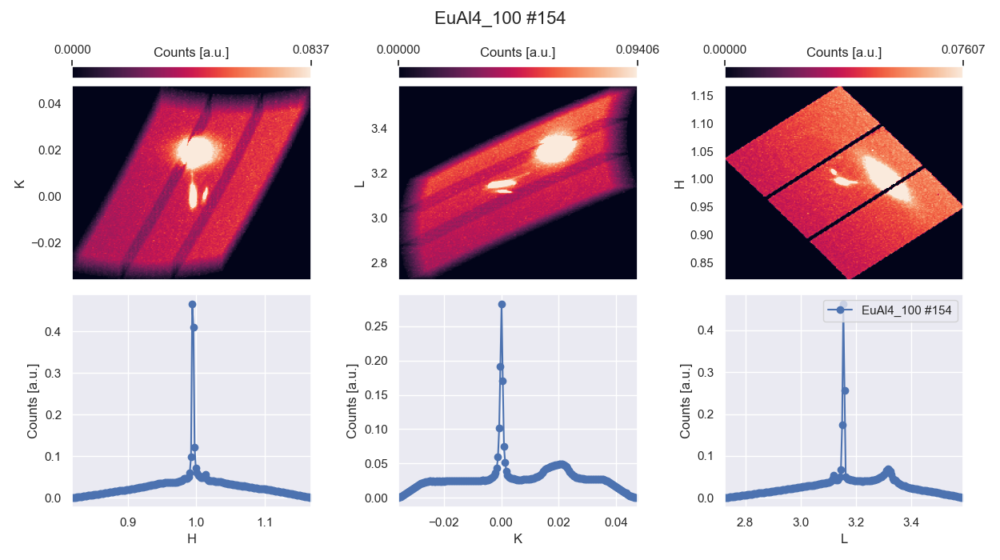

In [6]:
labels, ims = [], [None, None, None]

def create_range_widget(description, layout):
    return widgets.FloatRangeSlider(
        description=description, min=0, max=1, value=(0, 1), step=0.002,
        readout_format='.3f', layout=layout, continuous_update=False)

layout = widgets.Layout(width='30%')
HRange_widget, KRange_widget, LRange_widget = [create_range_widget(k, layout) for k in ['H', 'K', 'L']]

minmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=(2,98), step=0.5, description='minmax', readout_format='.1f', continuous_update=False)
overlay_widget = widgets.Checkbox(value=False, description='Overlay')
log_widget = widgets.Checkbox(value=False, description='Log')


def update_hkl_ranges():
    x, y, z, intensity = rmaps[scan_widget.value]
    bounds = get_bounds(x, y, z)

    for widget, bound in zip([HRange_widget, KRange_widget, LRange_widget], bounds):
        widget.unobserve_all()
        widget.max, widget.min, widget.max = np.inf, bound[0], bound[1]
        widget.value = (bound[0], bound[1])
        widget.observe(on_range_change)
    plot_all(scan_widget.value)
        
        
def on_range_change(new):
    plot_all(scan_widget.value)
HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)


def on_minmax_change(b):
    for idx, im in enumerate(ims):
        update_clim(im, idx)
minmax_widget.observe(on_minmax_change, names='value')


overlay_widget = widgets.Checkbox(value=False, description='Overlay')
def on_overlay_change(b):
    if not overlay_widget.value:
        plot_all(scan_widget.value)
overlay_widget.observe(on_overlay_change, names='value')


log_widget = widgets.Checkbox(value=False, description='Log')
def on_log(b):
    yscale = 'linear'
    if log_widget.value:
        yscale = 'log'
    for i in range(3):
        f1_ax2[i].set_yscale(yscale)
log_widget.observe(on_log, names='value')


def update_clim(im, i=0):
    vminmax = np.nanpercentile(im.get_array(), minmax_widget.value)
    im.set_clim(vmin=vminmax[0], vmax=vminmax[1])
    f1_ax1[i].grid(False)

    cb = plt.colorbar(im, ax=f1_ax1[i], cax=f1_caxs[i], orientation='horizontal', ticks=np.linspace(*ims[i].get_clim(), 2))
    f1_caxs[i].xaxis.set_ticks_position("top")
    cb.set_label('Counts [a.u.]', labelpad=-28)


def plot_all(scan):
    HKL, data = mask_data(*rmaps[scan], HRange_widget.value, KRange_widget.value, LRange_widget.value)
    
    if not overlay_widget.value:
        [ax.cla() for ax in f1.get_axes()]
        labels.clear()

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        if len(labels) == 0:
            #c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image, vmin=vminmax[0], vmax=vminmax[1])
            ims[i] = f1_ax1[i].imshow(image, extent=(HKL[x][0], HKL[x][-1], HKL[y][0], HKL[y][-1]), origin='lower', aspect='auto')
            f1_ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
            update_clim(ims[i], i)
        
        label = ''
        if i == 2:
            label = scan; labels.append(label)
        f1_ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o', label=label)
        f1_ax2[i].set_xlabel(f"{['H', 'K', 'L'][x]}")
        f1_ax2[i].set_ylabel('Counts [a.u.]')
        
    f1.suptitle(f'{scan}', fontsize=16, y=0.98)
    f1_ax2[2].legend()


f1, (f1_ax1, f1_ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12.5, 7), sharex='col', layout='tight')
f1.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

f1_caxs = []
for i in range(3):
    divider = make_axes_locatable(f1_ax1[i])
    f1_caxs.append(divider.append_axes("top", size="6%", pad="4%"))
    f1.add_axes(f1_caxs[-1])

scan_list = list(rmaps.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])
update_hkl_ranges()


def on_scan_change(change=None):
    update_hkl_ranges()
scan_widget.observe(on_scan_change, names='value')

out = widgets.interactive_output(plot_all, {'scan': scan_widget})
ui = widgets.VBox([widgets.HBox([scan_widget, minmax_widget, log_widget, overlay_widget]), 
                   widgets.HBox([HRange_widget, KRange_widget, LRange_widget])])

display(ui, out)

## Plot Raw Data

interactive(children=(Output(),), _dom_classes=('widget-interact',))

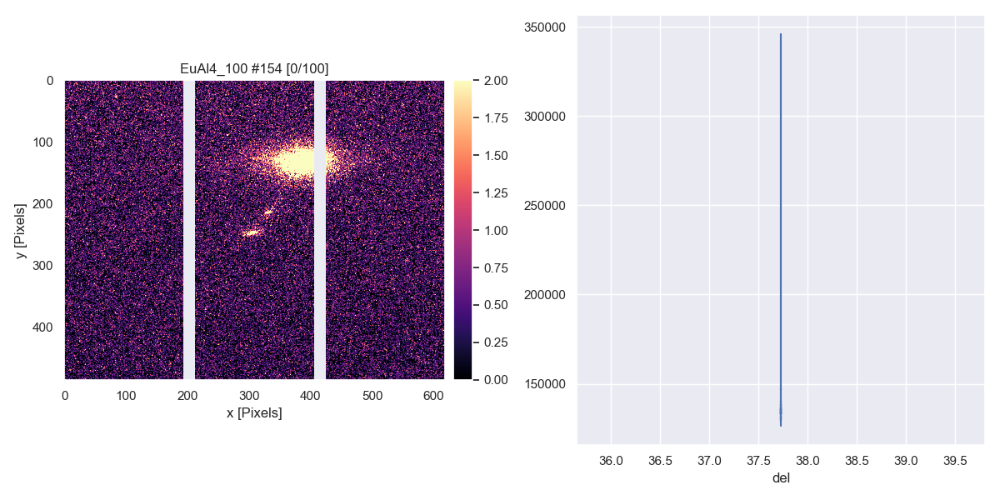

In [45]:
img_arr = edf_files = motors = counters = x_col = x_data = y_data = None  #, None, None, None, None, None, None

f2, (f2_ax1, f2_ax2) = plt.subplots(1, 2, figsize=(12, 6), layout='tight')

divider = make_axes_locatable(f2_ax1)
f2_cax1 = divider.append_axes("right", size="5%", pad=0.1)
f2.add_axes(f2_cax1)

scan_list = list(scans.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])

nimage_widget = widgets.IntSlider(min=0, max=1, step=1)
vminmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=[5, 95], step=0.5)

scan_list = list(scans.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])

motor_widget = widgets.Dropdown(description='motor')
counter_widget = widgets.Dropdown(description='normalize')


def get_x_data():
    return motor_widget.value, np.array(motors[motor_widget.value])
    

def on_motor_change(new):
    global x_data, ydata
    x_col, x_data = get_x_data()
    update_roi()
    #update_1d_plot()
motor_widget.observe(on_motor_change, names='value')


def update_scan_data():
    global img_arr, edf_files, motors, counters
    scan = scan_widget.value
    edf_files = get_edf_files(scan, base_path)
    img_arr = get_img_arr(edf_files, parallel=True, flip=True)
    motors, counters = get_scan_motors(edf_files), get_scan_counters(edf_files)
    update_widgets()

    
def update_widgets():
    global img_arr, edf_files, motors, counters
    nimage_widget.max = len(edf_files) - 1
    nimage_widget.value = min(nimage_widget.value, len(edf_files) - 1)
    
    motor_cols, counter_cols = list(motors.columns), list(counters.columns)
    motor_widget.options, motor_widget.value = motor_cols, motor_cols[0]
    counter_widget.options = ['None'] + counter_cols 

    
def on_scan_change(change=None):
    global img_arr
    update_scan_data()
    update_widgets()
    plot_lscan_roi(scan_widget.value, nimage_widget.value, vminmax_widget.value )
scan_widget.observe(on_scan_change, names='value')


def show_raw_image(scan, n, vminmax, ax, cax):
    global img_arr
    if img_arr is None:
        on_scan_change()
    
    n_ims = len(img_arr)
    if n_ims == 0:
        ax.cla()
        ax.set_title(f'{scan}: No Images')
        return
        
    nimage_widget.max = n_ims - 1
    n = min(n, n_ims-1)
    nimage_widget.value = n
    
    img = img_arr[n]
    
    minmax = np.nanpercentile(img, vminmax)
    i1 = ax.imshow(
        img, cmap=cmap, origin='upper',
        vmin=minmax[0], vmax=minmax[1], snap=False
        )
    ax.set_xlabel('x [Pixels]')
    ax.set_ylabel('y [Pixels]')
    ax.set_title(f'{scan} [{n}/{n_ims-1}]')
    ax.grid(False)
    
    cb1 = plt.colorbar(i1, cax=cax, use_gridspec=True)


def get_roi_sums(scan, xlim=None, ylim=None):
    global motors, x_col, x_data, y_data
    
    img_arr, energy, UB, angles, header = get_scan_info()
    if len(img_arr) == 0:
        return None, None, None

    xlim = [0, -1] if xlim is None else xlim
    ylim = [0, -1] if ylim is None else ylim

    im_shape = img_arr[0].shape
    rows = [max(0, ylim[0]), min(im_shape[0], ylim[1])]
    cols = [max(0, xlim[0]), min(im_shape[1], xlim[1])]
    
    y_data = []
    for img in img_arr:
        y_data.append(np.nansum(img[rows[0]:rows[1], cols[0]:cols[1]]))

    x_col, x_data = get_x_data()

    return x_col, x_data, y_data


def plot_roi_sums(x_col, x_data, y_data):
    if overplot_button.description == 'Overplot':
        f2_ax2.cla()

    f2_ax2.plot(x_data, y_data, '-')
    if log_button.description == 'Linear':
        f2_ax2.set_yscale('log')
    f2_ax2.set_xlabel(f'{x_col}')
    
    return x_col, x_data, y_data


def update_1d_plot():
    global motors, x_col, x_data, y_data
    
    f2_ax2.lines[0].set_data(x_data, y_data)

    
def create_roi_rectangle(ax):
    """
    Creates and returns a Rectangle patch for ROI selection.

    Args:
        ax: The Matplotlib axis to add the rectangle to.

    Returns:
        The Rectangle object.
    """
    rect = plt.Rectangle((0, 0), 1, 1, alpha=0.3, 
                         facecolor='white', edgecolor='white', zorder=100)
    ax.add_patch(rect)
    rect.set_visible(False)
    return rect


def setup_roi_selection(ax, update_roi): 
    """
    Sets up ROI selection functionality on a given axis.

    Args:
        ax: The Matplotlib axis for ROI selection.
    """
    rect = create_roi_rectangle(ax)
    
    # --------  Adding Feedback and Persistence --------
    def line_select_callback(eclick, erelease):
        x1, y1 = eclick.xdata, eclick.ydata
        x2, y2 = erelease.xdata, erelease.ydata
    
        # Update ROI
        xlim = [int(min(x1, x2)), int(max(x1, x2)) + 1]
        ylim = [int(min(y1, y2)), int(max(y1, y2)) + 1]
        if (xlim[1] - xlim[0] == 1) and (ylim[1] - ylim[0] == 1):
            xlim, ylim = None, None
    
        update_roi(xlim, ylim)
        
        # Update the selected rectangle visualization
        rect.set_xy((min(x1, x2), min(y1, y2)))
        rect.set_width(abs(x1 - x2))
        rect.set_height(abs(y1 - y2))
        #f2_ax1.figure.canvas.draw_idle()
        ax.figure.canvas.draw_idle()

    RS = RectangleSelector(ax, line_select_callback, 
                           useblit=True, button=[1],
                           minspanx=5, minspany=5, spancoords='pixels',
                           interactive=True)

    return rect, RS
    

def update_roi(xlim=None, ylim=None):
    x_col, x_data, y_data = get_roi_sums(scan_widget.value, xlim, ylim)
    if x_col is not None:
        plot_roi_sums(x_col, x_data, y_data)
    else:
        f2_ax2.cla()


# --------  Adding Feedback and Persistence --------
def line_select_callback(eclick, erelease):
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata

    # Update ROI
    xlim = [int(min(x1, x2)), int(max(x1, x2)) + 1]
    ylim = [int(min(y1, y2)), int(max(y1, y2)) + 1]
    if (xlim[1] - xlim[0] == 1) and (ylim[1] - ylim[0] == 1):
        xlim, ylim = None, None

    update_roi(xlim, ylim)
    
    # Update the selected rectangle visualization
    rect.set_xy((min(x1, x2), min(y1, y2)))
    rect.set_width(abs(x1 - x2))
    rect.set_height(abs(y1 - y2))
    #f2_ax1.figure.canvas.draw_idle()
    ax.figure.canvas.draw_idle()
    ax.legend()

rect, RS = setup_roi_selection(f2_ax1, update_roi) 


clear_button = widgets.Button(description="Clear Plot")
def on_clear_button_clicked(b):
    f2_ax2.cla()
clear_button.on_click(on_clear_button_clicked)


overplot_button = widgets.Button(description="Overplot")
def on_overplot_button_clicked(b):
    if overplot_button.description == 'Overplot':
        overplot_button.description = 'No Overplot'
    else:
        overplot_button.description = 'Overplot'
overplot_button.on_click(on_overplot_button_clicked)


log_button = widgets.Button(description="Log")
def on_log_button_clicked(b):
    if log_button.description == 'Log':
        f2_ax2.set_yscale('log')
        log_button.description = 'Linear'
    else:
        f2_ax2.set_yscale('linear')
        log_button.description = 'Log'
log_button.on_click(on_log_button_clicked)


update_scan_data()
def plot_lscan_roi():
    scan, n, vminmax = scan_widget.value, nimage_widget.value, vminmax_widget.value
    show_raw_image(scan, n, vminmax, f2_ax1, f2_cax1)
    update_roi()

    
ui = widgets.VBox([widgets.HBox([scan_widget, minmax_widget, log_widget, overlay_widget]), 
                   widgets.HBox([HRange_widget, KRange_widget, LRange_widget])])

interact(plot_lscan_roi)
ui = widgets.VBox([widgets.HBox([scan_widget, nimage_widget, vminmax_widget]),
                   widgets.HBox([clear_button, overplot_button, log_button, motor_widget, counter_widget])])

display(ui)

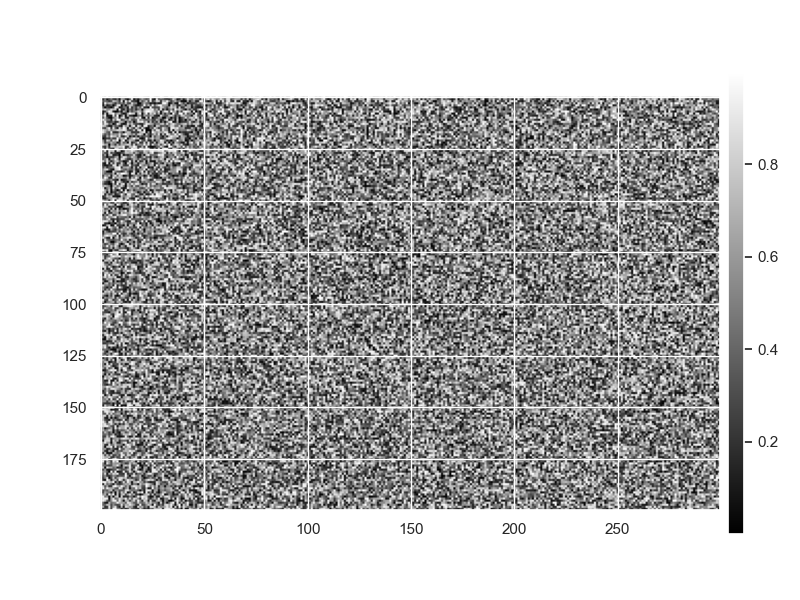

In [46]:
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector
import numpy as np
import ipywidgets as widgets
from IPython.display import display

def show_raw_image(img_arr, ax, cax):
    """Display the selected image with intensity adjustments."""
    if img_arr.size == 0:
        ax.text(0.5, 0.5, 'No Image', transform=ax.transAxes, ha="center", va="center")
        return None

    img_display = ax.imshow(img_arr, cmap='gray', origin='upper')
    plt.colorbar(img_display, cax=cax, orientation='vertical')
    return img_display

def update_image_on_selection(scan, n, vminmax, ax, cax):
    """Fetch and display the image based on the current selection."""
    global img_arr  # Assuming img_arr is updated elsewhere based on scan selection
    img_arr = np.random.rand(200, 300)  # Placeholder for image data fetch
    show_raw_image(img_arr, ax, cax)

def setup_roi_selection(ax, callback):
    """Setup interactive ROI selection on the image."""
    def onselect(eclick, erelease):
        # Extract the coordinates of the ROI
        x1, y1 = int(eclick.xdata), int(eclick.ydata)
        x2, y2 = int(erelease.xdata), int(erelease.ydata)
        callback([x1, x2], [y1, y2])
    
    rect_selector = RectangleSelector(ax, onselect, useblit=True, button=[1], minspanx=5, minspany=5, spancoords='pixels', interactive=True)
    return rect_selector

def on_roi_selected(xlim, ylim):
    """Callback function to process the selected ROI."""
    # Process the selected ROI, e.g., by updating plots or data based on the selection
    print(f"Selected ROI: X={xlim}, Y={ylim}")
    # Here you can add code to update plots or analysis based on the selected ROI.

# Main plot setup
fig, ax = plt.subplots(figsize=(8, 6))
cax = fig.add_axes([ax.get_position().x1 + 0.01, ax.get_position().y0, 0.02, ax.get_position().height])

# Dummy data and image update to simulate the workflow
img_arr = np.random.rand(200, 300)  # Placeholder for the actual image data
show_raw_image(img_arr, ax, cax)

# Setting up ROI selection
rect_selector = setup_roi_selection(ax, on_roi_selected)

# Widget setup and display
scan_widget = widgets.Dropdown(options=['Scan 1', 'Scan 2'], description='Scan:')
nimage_widget = widgets.IntSlider(min=0, max=10, step=1, description='Image Index:')
vminmax_widget = widgets.FloatRangeSlider(min=0, max=1, value=[0.1, 0.9], step=0.01, description='Intensity Range:')
widgets_container = widgets.VBox([scan_widget, nimage_widget, vminmax_widget])
display(widgets_container)

# Linking widget interaction to update the displayed image
def on_scan_or_image_change(change):
    # Here you'd fetch the new image based on the scan and image index
    update_image_on_selection(scan_widget.value, nimage_widget.value, vminmax_widget.value, ax, cax)
    fig.canvas.draw_idle()  # Redraw the figure to show the updated image

scan_widget.observe(on_scan_or_image_change, names='value')
nimage_widget.observe(on_scan_or_image_change, names='value')
vminmax_widget.observe(on_scan_or_image_change, names='value')

interactive(children=(Dropdown(description='scan', index=3, options=('EuAl4_100 #82', 'EuAl4_100 #123', 'EuAl4…

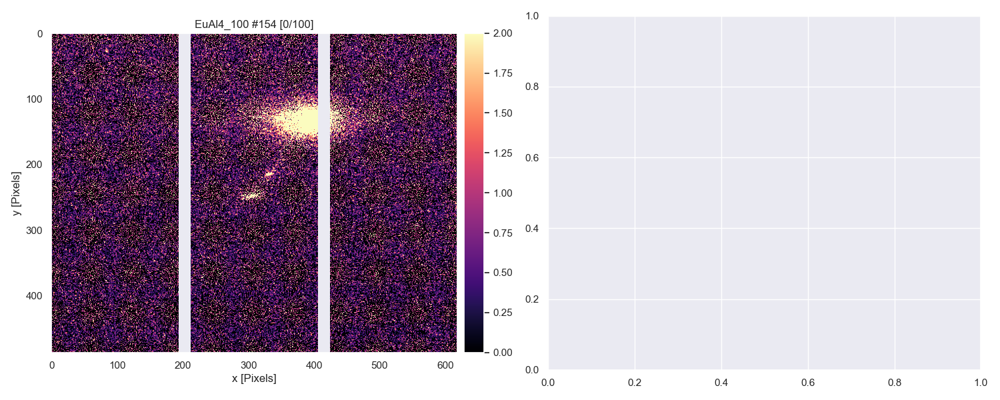

In [7]:
f2, (f2_ax1, f2_ax2) = plt.subplots(1, 2, figsize=(15, 6), layout='tight')

divider = make_axes_locatable(f2_ax1)
f2_cax1 = divider.append_axes("right", size="5%", pad=0.1)
f2.add_axes(f2_cax1)

scan_list = list(scans.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])

nimage_widget = widgets.IntSlider(min=0, max=1, step=1)
vminmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=[5, 95], step=0.5)

scan_list = list(scans.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])

motor_widget = widgets.Dropdown(description='motor')
counter_widget = widgets.Dropdown(description='normalize')

def update_motors_and_counters():
    scan = scan_widget.value
    edf_files = get_edf_files(scan, base_path)
    motors, counters = get_scan_motors(edf_files), get_scan_counters(edf_files)
    motor_widget.options = list(motors.columns)
    counter_widget.options = list(counters.columns)

    
img_arr = None
def on_scan_change(change=None):
    global img_arr
    update_motors_and_counters()
    img_arr, energy, UB, angles, header = get_scan_info()

    plot_lscan_roi(scan_widget.value, nimage_widget.value, vminmax_widget.value )
scan_widget.observe(on_scan_change, names='value')

def get_scan_info():
    k = scan_widget.value
    sample_name, scan_num = k.split()
    scan_num = int(scan_num[1:])

    img_dir = base_path / scans[k]
    return load_stack(img_dir, sample_name, scan_num, parallel=True, flip=True)


def show_raw_image(scan, n, vminmax, ax, cax):
    global img_arr
    if img_arr is None:
        on_scan_change()
    
    n_ims = len(img_arr)
    if n_ims == 0:
        ax.cla()
        ax.set_title(f'{scan}: No Images')
        return
        
    nimage_widget.max = n_ims - 1
    n = min(n, n_ims-1)
    nimage_widget.value = n
    
    img = img_arr[n]
    
    minmax = np.nanpercentile(img, vminmax)
    i1 = ax.imshow(
        img, cmap=cmap, origin='upper',
        vmin=minmax[0], vmax=minmax[1], snap=False
        )
    ax.set_xlabel('x [Pixels]')
    ax.set_ylabel('y [Pixels]')
    ax.set_title(f'{scan} [{n}/{n_ims-1}]')
    ax.grid(False)
    
    cb1 = plt.colorbar(i1, cax=cax, use_gridspec=True)


def get_roi_sums(scan, xlim=None, ylim=None):
    img_arr, energy, UB, angles, header = get_scan_info()
    if len(img_arr) == 0:
        return None, None, None

    xlim = [0, -1] if xlim is None else xlim
    ylim = [0, -1] if ylim is None else ylim

    im_shape = img_arr[0].shape
    rows = [max(0, ylim[0]), min(im_shape[0], ylim[1])]
    cols = [max(0, xlim[0]), min(im_shape[1], xlim[1])]
    
    y_data = []
    for img in img_arr:
        y_data.append(np.nansum(img[rows[0]:rows[1], cols[0]:cols[1]]))

    spec_fpath, scan_num = header['specfile'], f"{header['scanno']}.1"
    x_col, x_data = get_spec_x_data(spec_fpath, scan_num)

    return x_col, x_data, y_data

def get_spec_x_data(fname, scan_number):    
    spec_file = SpecFile(str(fname))

    if isinstance(scan_number, int):
        spec_scan = spec_file[scan_number-1]
    else:
        spec_scan = spec_file[scan_number]
        
    x_col = get_spec_x_col(fname, scan_number)
    if x_col in spec_scan.labels:
        x_data = spec_scan.data_column_by_name(x_col)
    elif x_col.capitalize() in spec_scan.labels:
        x_data = spec_scan.data_column_by_name(x_col.capitalize())
    else:
        print('fuck you')
        
    spec_file.close()
    return x_col, x_data


def get_spec_x_col(fname, scan_number):
    spec_file = SpecFile(str(fname))

    if isinstance(scan_number, int):
        spec_scan = spec_file[scan_number-1]
    else:
        spec_scan = spec_file[scan_number]

    spec_file.close()

    scan_hdr = spec_scan.scan_header_dict['S'].split()
    x_col = scan_hdr[2]
    
    if scan_hdr[1] == 'hklscan':
        hkl_ranges = [float(scan_hdr[3]) - float(scan_hdr[2]),
                      float(scan_hdr[5]) - float(scan_hdr[4]),
                      float(scan_hdr[7]) - float(scan_hdr[6])]
    
        x_col = ['H', 'K', 'L'][np.nonzero(hkl_ranges)[0][0]]
   
    return x_col


nimage_widget = widgets.IntSlider(min=0, max=1, step=1)
vminmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=[5, 95], step=0.5)

def plot_roi_sums(x_col, x_data, y_data):
    if overplot_button.description == 'Overplot':
        f2_ax2.cla()

    f2_ax2.plot(x_data, y_data, '-')
    if log_button.description == 'Linear':
        f2_ax2.set_yscale('log')
    f2_ax2.set_xlabel(f'{x_col}')
    
    return x_col, x_data, y_data


def create_roi_rectangle(ax):
    """
    Creates and returns a Rectangle patch for ROI selection.

    Args:
        ax: The Matplotlib axis to add the rectangle to.

    Returns:
        The Rectangle object.
    """
    rect = plt.Rectangle((0, 0), 1, 1, alpha=0.3, 
                         facecolor='white', edgecolor='white', zorder=100)
    ax.add_patch(rect)
    rect.set_visible(False)
    return rect


def setup_roi_selection(ax, update_roi): 
    """
    Sets up ROI selection functionality on a given axis.

    Args:
        ax: The Matplotlib axis for ROI selection.
    """
    rect = create_roi_rectangle(ax)
    
    # --------  Adding Feedback and Persistence --------
    def line_select_callback(eclick, erelease):
        x1, y1 = eclick.xdata, eclick.ydata
        x2, y2 = erelease.xdata, erelease.ydata
    
        # Update ROI
        xlim = [int(min(x1, x2)), int(max(x1, x2)) + 1]
        ylim = [int(min(y1, y2)), int(max(y1, y2)) + 1]
        if (xlim[1] - xlim[0] == 1) and (ylim[1] - ylim[0] == 1):
            xlim, ylim = None, None
    
        update_roi(xlim, ylim)
        
        # Update the selected rectangle visualization
        rect.set_xy((min(x1, x2), min(y1, y2)))
        rect.set_width(abs(x1 - x2))
        rect.set_height(abs(y1 - y2))
        #f2_ax1.figure.canvas.draw_idle()
        ax.figure.canvas.draw_idle()

    RS = RectangleSelector(ax, line_select_callback, 
                           useblit=True, button=[1],
                           minspanx=5, minspany=5, spancoords='pixels',
                           interactive=True)

    # Note: You might want to return 'rect' and 'RS' if you need them later.
    return rect, RS
    

def update_roi(xlim=None, ylim=None):
    x_col, x_data, y_data = get_roi_sums(scan_widget.value, xlim, ylim)
    if x_col is not None:
        plot_roi_sums(x_col, x_data, y_data)
    else:
        f2_ax2.cla()


# --------  Adding Feedback and Persistence --------
def line_select_callback(eclick, erelease):
    x1, y1 = eclick.xdata, eclick.ydata
    x2, y2 = erelease.xdata, erelease.ydata

    # Update ROI
    xlim = [int(min(x1, x2)), int(max(x1, x2)) + 1]
    ylim = [int(min(y1, y2)), int(max(y1, y2)) + 1]
    if (xlim[1] - xlim[0] == 1) and (ylim[1] - ylim[0] == 1):
        xlim, ylim = None, None

    update_roi(xlim, ylim)
    
    # Update the selected rectangle visualization
    rect.set_xy((min(x1, x2), min(y1, y2)))
    rect.set_width(abs(x1 - x2))
    rect.set_height(abs(y1 - y2))
    #f2_ax1.figure.canvas.draw_idle()
    ax.figure.canvas.draw_idle()
    ax.legend()

rect, RS = setup_roi_selection(f2_ax1, update_roi) 


clear_button = widgets.Button(description="Clear Plot")
def on_clear_button_clicked(b):
    f2_ax2.cla()
clear_button.on_click(on_clear_button_clicked)

overplot_button = widgets.Button(description="Overplot")
def on_overplot_button_clicked(b):
    if overplot_button.description == 'Overplot':
        overplot_button.description = 'No Overplot'
    else:
        overplot_button.description = 'Overplot'
overplot_button.on_click(on_overplot_button_clicked)

log_button = widgets.Button(description="Log")
def on_log_button_clicked(b):
    if log_button.description == 'Log':
        f2_ax2.set_yscale('log')
        log_button.description = 'Linear'
    else:
        f2_ax2.set_yscale('linear')
        log_button.description = 'Log'
log_button.on_click(on_log_button_clicked)


def plot_lscan_roi(scan, n, vminmax):
    show_raw_image(scan, n, vminmax, f2_ax1, f2_cax1)
    update_roi()

interact(plot_lscan_roi, scan=scan_widget, n=nimage_widget, vminmax=vminmax_widget);
display(widgets.HBox([clear_button, overplot_button, log_button, vminmax_widget]))

In [14]:
scan = 'EuAl4_100 #123'
edf_files = get_edf_files(scan, base_path)

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.widgets import RectangleSelector
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import ipywidgets as widgets
from IPython.display import display, clear_output
from specio import specread

# Assuming necessary modules like specread for SPEC file handling are installed

def create_dropdown_widget(options, description):
    return widgets.Dropdown(options=options, value=options[-1], description=description)

def create_slider_widget(min, max, step, value, description):
    return widgets.IntSlider(min=min, max=max, step=step, value=value, description=description)

def create_range_slider_widget(min, max, step, value, description):
    return widgets.FloatRangeSlider(min=min, max=max, step=step, value=value, description=description)

# Assuming get_scan_info and other functions are defined properly
scan_list = list(scans.keys())
scan_widget = create_dropdown_widget(scan_list, 'Scan:')
nimage_widget = create_slider_widget(0, 1, 1, 0, 'Image Number:')
vminmax_widget = create_range_slider_widget(0, 100, 0.5, [5, 95], 'Min/Max:')

# Setup Matplotlib figure and axes
f2, (f2_ax1, f2_ax2) = plt.subplots(1, 2, figsize=(15, 6), layout='tight')
divider = make_axes_locatable(f2_ax1)
f2_cax1 = divider.append_axes("right", size="5%", pad=0.1)

def plot_scan(scan):
    img_arr, metadata = get_scan_info(scan)
    show_raw_image(scan, nimage_widget.value, vminmax_widget.value, f2_ax1, f2_cax1)
    plot_roi_sums(img_arr, metadata, f2_ax2)

def get_scan_info(scan):
    # Implement logic to extract image array and metadata
    return img_arr, metadata

def show_raw_image(scan, n, vminmax, ax, cax):
    # Implement logic to display raw image
    pass

def plot_roi_sums(img_arr, metadata, ax):
    # Implement logic to plot ROI sums
    pass

# Widget interaction functions
def on_scan_change(change):
    plot_scan(change.new)

def on_image_or_minmax_change(change):
    plot_scan(scan_widget.value)

# Observing changes
scan_widget.observe(on_scan_change, names='value')
nimage_widget.observe(on_image_or_minmax_change, names='value')
vminmax_widget.observe(on_image_or_minmax_change, names='value')

# Display UI
ui = widgets.HBox([scan_widget, nimage_widget, vminmax_widget])
display(ui)

# Initial plot
plot_scan(scan_widget.value)


In [ ]:
def get_scan_motors_and_counters(edf_files)

In [11]:
scan = scans['EuAl4_100 #123']
sample_name, scan_num = k.split()
scan_num = int(scan_num[1:])

img_dir = base_path / scans[k]

edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

motors_and_counters = [get_motors_and_counters(edf_file) for edf_file in edf_files]

In [26]:
scan = 'EuAl4_100 #123'
edf_files = get_edf_files(scan)

ValueError: not enough values to unpack (expected 2, got 0)

In [23]:
motors_df = pd.DataFrame(motors)

In [24]:
motors_df['eta']

0      17.3903
1      17.3932
2      17.3962
3      17.3992
4      17.4022
        ...   
96     17.6782
97     17.6812
98     17.6842
99     17.6872
100    17.6902
Name: eta, Length: 101, dtype: float64

In [16]:
def conv_dicts_to_df(dicts):
    # Convert each dictionary to a DataFrame and concatenate them
    dfs = [pd.DataFrame({'key': list(d.keys()), 'value': list(d.values())}) for d in dicts]
    df_concat = pd.concat(dfs)

    # Group by the key and aggregate the values into lists
    return df_concat.groupby('key')['value'].apply(list).reset_index()

In [17]:
motors_df = conv_dicts_to_df(motors)

In [21]:
motors_df.key

0        Emot
1     ami_mag
2        amp1
3        arcx
4        arcy
       ...   
93      ytilt
94      zdiff
95      zdown
96     ztrans
97        zup
Name: key, Length: 98, dtype: object

In [ ]:
def read_image(file, shape=(195, 487), dtype='int32', header_skip=4096, flip=False):
    """
    Generic function to read edf, TIFF and RAW files. Assumes specific structure.
    TIFF files have a header to skip, RAW files don't.
    """
    if os.path.splitext(str(file))[1][1:] == 'edf':
        with fabio.open(file) as f:
            arr = f.data.astype(float)
        mask = detectors.Pilatus300k().get_mask()
        arr[mask == True] = np.NaN
        if flip:
            arr = np.fliplr(arr.T)
            #arr = arr.T
        return arr

    try:
        with open(file, 'rb') as im:
            if os.path.splitext(str(file))[1][1:] in ['tif', 'tiff']:
                im.seek(header_skip)
            arr = np.frombuffer(im.read(), dtype=dtype)
            arr = arr.reshape(shape)
        if flip:
            arr = np.fliplr(arr)
        return arr.astype(float)
    except Exception as e:
        print(f"Error reading file: {file}, Error: {str(e)}")
        return None


def get_edf_header(file):
    """
    Get header from EDF file
    """
    with fabio.open(file) as f:
        img_header = f.header
    return img_header


def read_scan_data(edf_file, angles_dict, flip=False):
    header = get_edf_header(edf_file)
    motors = {k:float(v) for k, v in zip(header['motor_mne'].split(), header['motor_pos'].split())}
    counters = {k:float(v) for k, v in zip(header['counter_mne'].split(), header['counter_pos'].split())}

    for dm in angles_dict.keys():
        angles_dict[dm].append(motors[dm])
    
    return read_image(edf_file, flip=flip)


def load_stack(img_dir, sample_name, scan_num, parallel=True, flip=False):
    """
    Loads a stack of images, applying parallelization if requested.
    """
    # File naming patterns
    edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

    # Get energy and UB matrix
    header = get_edf_header(edf_files[0])
    energy = 12.398 / float(header['source_wavelength']) * 1e3
    UB = np.array(header['UB_pos'].split()).astype(float).reshape(3,3)

    diff_motors = ['del', 'eta', 'phi', 'chi', 'nu', 'mu']
    angles_dict = {dm:[] for dm in diff_motors}

    # Parallel or sequential reading of image data
    if parallel:
        with Parallel(n_jobs=min(cpu_count(), len(edf_files)), require='sharedmem') as parallel:
            scan_data = parallel(delayed(read_scan_data)(f, angles_dict, flip) for f in edf_files)
    else:
        scan_data = [read_scan_data(f, angles_dict, flip) for f in edf_files]

    return np.array(scan_data), energy, UB, angles_dict, header


def grid_img_data(img, energy, UB, angles_dict, header, bins=(200, 200, 200)):
    """
    Maps image data to reciprocal space, using a gridder for binning.
    """
    qconversion = xu.QConversion(['z-', 'y+', 'z-'], ['z-'], [0, 1, 0])
    hxrd = xu.HXRD([0, 1, 0], [0, 0, 1], geometry='real', en=energy, qconv=qconversion)

    Nch1, Nch2 = header['Dim_1'], header['Dim_2']
    cch1, cch2 = header['beam_x'], header['beam_y']
    pwidth1, pwidth2 = header['pixel_size_x'], header['pixel_size_y']
    distance = header['detector_distance']
    
    hxrd.Ang2Q.init_area('x-', 'z-', 
                         cch1=cch1, cch2=cch2, 
                         Nch1=Nch1, Nch2=Nch2,
                         pwidth1=pwidth1, pwidth2=pwidth2,
                         distance=distance)

    angle_values = [angles_dict[motor] for motor in ['eta', 'chi', 'phi', 'del']]
    qx, qy, qz = hxrd.Ang2Q.area(*angle_values, UB=UB)

    gridder = xu.Gridder3D(*bins)
    gridder(qx, qy, qz, img)
    return gridder.xaxis, gridder.yaxis, gridder.zaxis, gridder.data.astype(float)


def mask_data(grid_data, xyz, HRange=(-np.inf, np.inf), KRange=(-np.inf, np.inf), LRange=(-np.inf, np.inf)):
    """Assign values out or range to NaN and return grid_data along with H, K, L axes"""
    H, K, L = xyz
    H_inds = (H >= HRange[0]) & (H <= HRange[1])
    K_inds = (K >= KRange[0]) & (K <= KRange[1])
    L_inds = (L >= LRange[0]) & (L <= LRange[1])
    
    return H[H_inds], K[K_inds], L[L_inds], grid_data[H_inds,:,:][:,K_inds,:][:,:,L_inds]


def get_bounds(x, y, z):
    return [
        [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
        [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
        [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
    ]



labels, ims = [], [None, None, None]

layout = widgets.Layout(width='30%')
HRange_widget = widgets.FloatRangeSlider(step=0.002, description='H', readout_format='.3f', layout=layout, continuous_update=False)
KRange_widget = widgets.FloatRangeSlider(step=0.002, description='K', readout_format='.3f', layout=layout, continuous_update=False)
LRange_widget = widgets.FloatRangeSlider(step=0.002, description='L', readout_format='.3f', layout=layout, continuous_update=False)

def on_range_change(new):
    plot_all(scan_widget.value)
HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)


minmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=(2,98), step=0.5, description='minmax', readout_format='.1f', continuous_update=False)
def set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget):
    x, y, z, intensity = rmaps[scan_widget.value]
    bounds = get_bounds(x, y, z)

    HRange, KRange, LRange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
    
    HRange_widget.unobserve_all(); KRange_widget.unobserve_all(); LRange_widget.unobserve_all()
    HRange_widget.max = KRange_widget.max = LRange_widget.max = np.inf
    HRange_widget.min, HRange_widget.max, HRange_widget.value = HRange[0], HRange[1], [HRange[0], HRange[1]]
    KRange_widget.min, KRange_widget.max, KRange_widget.value = KRange[0], KRange[1], [KRange[0], KRange[1]]
    LRange_widget.min, LRange_widget.max, LRange_widget.value = LRange[0], LRange[1], [LRange[0], LRange[1]]
    HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)


def on_minmax_change(b):
    for idx, im in enumerate(ims):
        update_clim(im, idx)
minmax_widget.observe(on_minmax_change, names='value')

overlay_widget = widgets.Checkbox(value=False, description='Overlay')
def on_overlay_change(b):
    if not overlay_widget.value:
        plot_all(scan_widget.value)
overlay_widget.observe(on_overlay_change, names='value')


log_widget = widgets.Checkbox(value=False, description='Log')
def on_log(b):
    yscale = 'linear'
    if log_widget.value:
        yscale = 'log'
    for i in range(3):
        f1_ax2[i].set_yscale(yscale)
log_widget.observe(on_log, names='value')


def update_clim(im, i=0):
    vminmax = np.nanpercentile(im.get_array(), minmax_widget.value)
    im.set_clim(vmin=vminmax[0], vmax=vminmax[1])
    f1_ax1[i].grid(False)

    cb = plt.colorbar(im, ax=f1_ax1[i], cax=f1_caxs[i], orientation='horizontal', ticks=np.linspace(*ims[i].get_clim(), 2))
    f1_caxs[i].xaxis.set_ticks_position("top")
    cb.set_label('Counts [a.u.]', labelpad=-28)


sns.set(font_scale=1)
def plot_all(scan):#, overlay):
    print(scan)
    x, y, z, intensity = rmaps[scan]

    #HRange = HRange_widget.value
    H, K, L, data = mask_data(intensity, (x, y, z), HRange_widget.value, KRange_widget.value, LRange_widget.value)
    HKL = [H, K, L]

    if not overlay_widget.value:
        [ax.cla() for ax in f1.get_axes()]
        labels.clear()

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        if len(labels) == 0:
            #c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image, vmin=vminmax[0], vmax=vminmax[1])
            ims[i] = f1_ax1[i].imshow(image, extent=(HKL[x][0], HKL[x][-1], HKL[y][0], HKL[y][-1]), origin='lower', aspect='auto')
            f1_ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
            update_clim(ims[i], i)
        
        label = ''
        if i == 2:
            label = scan; labels.append(label)
        f1_ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o', label=label)
        f1_ax2[i].set_xlabel(f"{['H', 'K', 'L'][x]}")
        f1_ax2[i].set_ylabel('Counts [a.u.]')
        
    f1.suptitle(f'{scan}', fontsize=16, y=0.98)
    f1_ax2[2].legend()


f1, (f1_ax1, f1_ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12.5, 7), sharex='col', layout='tight')
f1.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

f1_caxs = []
for i in range(3):
    divider = make_axes_locatable(f1_ax1[i])
    f1_caxs.append(divider.append_axes("top", size="6%", pad="4%"))
    f1.add_axes(f1_caxs[-1])

scan_list = list(rmaps.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])
set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)


def on_scan_change(change=None):
    set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)
scan_widget.observe(on_scan_change, names='value')

out = widgets.interactive_output(plot_all, {'scan': scan_widget}) #, 'overlay': overlay_widget})
ui = widgets.VBox([widgets.HBox([scan_widget, minmax_widget, log_widget, overlay_widget]), widgets.HBox([HRange_widget, KRange_widget, LRange_widget])])

display(ui, out)

Output()

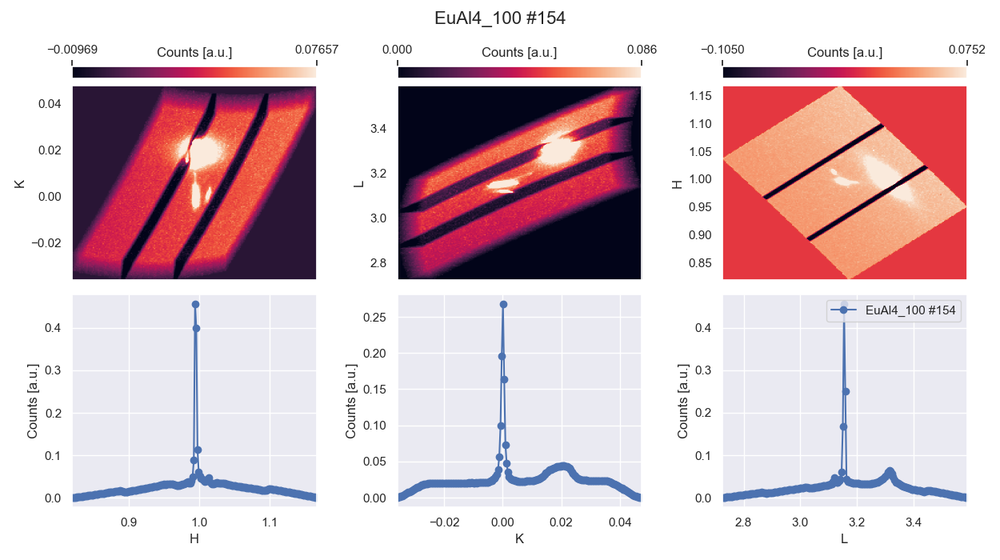

In [9]:
labels, ims = [], [None, None, None]

layout = widgets.Layout(width='30%')
HRange_widget = widgets.FloatRangeSlider(step=0.002, description='H', readout_format='.3f', layout=layout, continuous_update=False)
KRange_widget = widgets.FloatRangeSlider(step=0.002, description='K', readout_format='.3f', layout=layout, continuous_update=False)
LRange_widget = widgets.FloatRangeSlider(step=0.002, description='L', readout_format='.3f', layout=layout, continuous_update=False)

def on_range_change(new):
    plot_all(scan_widget.value)
HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)


minmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=(2,98), step=0.5, description='minmax', readout_format='.1f', continuous_update=False)
def set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget):
    x, y, z, intensity = rmaps[scan_widget.value]
    bounds = get_bounds(x, y, z)

    HRange, KRange, LRange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
    
    HRange_widget.unobserve_all(); KRange_widget.unobserve_all(); LRange_widget.unobserve_all()
    HRange_widget.max = KRange_widget.max = LRange_widget.max = np.inf
    HRange_widget.min, HRange_widget.max, HRange_widget.value = HRange[0], HRange[1], [HRange[0], HRange[1]]
    KRange_widget.min, KRange_widget.max, KRange_widget.value = KRange[0], KRange[1], [KRange[0], KRange[1]]
    LRange_widget.min, LRange_widget.max, LRange_widget.value = LRange[0], LRange[1], [LRange[0], LRange[1]]
    HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)


def on_minmax_change(b):
    for idx, im in enumerate(ims):
        update_clim(im, idx)
minmax_widget.observe(on_minmax_change, names='value')

overlay_widget = widgets.Checkbox(value=False, description='Overlay')
def on_overlay_change(b):
    if not overlay_widget.value:
        plot_all(scan_widget.value)
overlay_widget.observe(on_overlay_change, names='value')


log_widget = widgets.Checkbox(value=False, description='Log')
def on_log(b):
    yscale = 'linear'
    if log_widget.value:
        yscale = 'log'
    for i in range(3):
        f1_ax2[i].set_yscale(yscale)
log_widget.observe(on_log, names='value')


def update_clim(im, i=0):
    vminmax = np.nanpercentile(im.get_array(), minmax_widget.value)
    im.set_clim(vmin=vminmax[0], vmax=vminmax[1])
    f1_ax1[i].grid(False)

    cb = plt.colorbar(im, ax=f1_ax1[i], cax=f1_caxs[i], orientation='horizontal', ticks=np.linspace(*ims[i].get_clim(), 2))
    f1_caxs[i].xaxis.set_ticks_position("top")
    cb.set_label('Counts [a.u.]', labelpad=-28)


sns.set(font_scale=1)
def plot_all(scan):#, overlay):
    print(scan)
    x, y, z, intensity = rmaps[scan]

    #HRange = HRange_widget.value
    H, K, L, data = mask_data(intensity, (x, y, z), HRange_widget.value, KRange_widget.value, LRange_widget.value)
    HKL = [H, K, L]

    if not overlay_widget.value:
        [ax.cla() for ax in f1.get_axes()]
        labels.clear()

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        if len(labels) == 0:
            #c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image, vmin=vminmax[0], vmax=vminmax[1])
            ims[i] = f1_ax1[i].imshow(image, extent=(HKL[x][0], HKL[x][-1], HKL[y][0], HKL[y][-1]), origin='lower', aspect='auto')
            f1_ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
            update_clim(ims[i], i)
        
        label = ''
        if i == 2:
            label = scan; labels.append(label)
        f1_ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o', label=label)
        f1_ax2[i].set_xlabel(f"{['H', 'K', 'L'][x]}")
        f1_ax2[i].set_ylabel('Counts [a.u.]')
        
    f1.suptitle(f'{scan}', fontsize=16, y=0.98)
    f1_ax2[2].legend()


f1, (f1_ax1, f1_ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12.5, 7), sharex='col', layout='tight')
f1.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

f1_caxs = []
for i in range(3):
    divider = make_axes_locatable(f1_ax1[i])
    f1_caxs.append(divider.append_axes("top", size="6%", pad="4%"))
    f1.add_axes(f1_caxs[-1])

scan_list = list(rmaps.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])
set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)


def on_scan_change(change=None):
    set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)
scan_widget.observe(on_scan_change, names='value')

out = widgets.interactive_output(plot_all, {'scan': scan_widget}) #, 'overlay': overlay_widget})
ui = widgets.VBox([widgets.HBox([scan_widget, minmax_widget, log_widget, overlay_widget]), widgets.HBox([HRange_widget, KRange_widget, LRange_widget])])

display(ui, out)

In [10]:
# Simplifying the setup of widgets
def create_range_widget(description, layout):
    return widgets.FloatRangeSlider(description=description, min=0, max=1, value=(0, 1),
                                     step=0.002, readout_format='.3f', layout=layout, continuous_update=False)

layout = widgets.Layout(width='30%')
HRange_widget, KRange_widget, LRange_widget = [create_range_widget(k, layout) for k in ['H', 'K', 'L']]
minmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=(2,98), step=0.5, description='minmax', readout_format='.1f', continuous_update=False)
overlay_widget = widgets.Checkbox(value=False, description='Overlay')
log_widget = widgets.Checkbox(value=False, description='Log')

# Simplifying the callback functions
def update_plots():
    # Retrieve selected scan data and update the plot accordingly
    scan = scan_widget.value
    x, y, z, intensity = rmaps[scan]
    bounds = get_bounds(x, y, z)
    update_hkl_ranges(bounds)
    plot_all(scan)

def update_hkl_ranges(bounds):
    for widget, bound in zip([HRange_widget, KRange_widget, LRange_widget], bounds):
        widget.min, widget.max = bound[0], bound[1]
        widget.value = (bound[0], bound[1])

# Link widgets with actions
for widget in [HRange_widget, KRange_widget, LRange_widget, minmax_widget, overlay_widget, log_widget]:
    widget.observe(lambda change: update_plots(), 'value')

# The plotting function focuses on updating existing plots rather than recreating them
def plot_all(scan):
    # This function should focus on updating the plots based on current widget states
    # For instance, updating the data source for existing plot objects rather than creating new ones
    pass

# UI setup
scan_widget = widgets.Dropdown(options=list(rmaps.keys()), value=list(rmaps.keys())[0])
ui = widgets.VBox([
    widgets.HBox([scan_widget, minmax_widget, log_widget, overlay_widget]),
    widgets.HBox([HRange_widget, KRange_widget, LRange_widget])
])

# Initial plot
update_plots()

display(ui)

TraitError: setting min > max

In [ ]:
def update_roi(xlim=None, ylim=None):
    x_col, x_data, y_data = get_roi_sums(scan_widget.value, xlim, ylim)
    if x_col is not None:
        plot_roi_sums(x_col, x_data, y_data)
    else:
        f2_ax2.cla()

rect, RS = setup_roi_selection(f2_ax1, update_roi) 




In [39]:
sf = SpecFile('/data/visitor/ihhc3985/bm28/20240416/RAW_DATA/EuAl4_100')

In [57]:
sd = sf["126.1"]

In [58]:
img_dir = Path(r'/data/bm28/inhouse/run23_3/APS/July_2023/Images/002/Cool')
sample_name = 'STO_20nm'
scan_num = 384

edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

img_arr = read_image(edf_files[0])
header = get_edf_header(edf_files[0])

header

['Eta',
 'H',
 'K',
 'L',
 'Epoch',
 'Seconds',
 'Current',
 'pico1',
 'pico2',
 'Io',
 'p4',
 'Iref',
 'x',
 'y',
 'fwhmx',
 'fwhmy',
 'intens',
 'iroi',
 'p6',
 'p7',
 'p8',
 'It',
 'p10',
 'Temp',
 'apd',
 'cdet',
 'trans',
 'attn',
 'iroi2',
 'Qx',
 'Qz',
 'Qref',
 'fund0',
 'fund1',
 'fluo3',
 'fluo1',
 'fluo2',
 'temp_A',
 'temp_B',
 'delcnt',
 'etacnt',
 'mucnt',
 'nucnt',
 'chicnt',
 'phicnt',
 'res_A',
 'res_B',
 'euro_pv',
 'euro_tsp',
 'euro_wsp',
 'c100',
 'xicr00',
 'xocr00',
 'xlt00',
 'xdt00',
 'xicr01',
 'xocr01',
 'xlt01',
 'xdt01',
 'mca0',
 'mca1',
 'mca2',
 'fund2',
 'fluo4',
 'nomon',
 'iroibg',
 'fluo0',
 'Imon',
 'Vmon',
 'lcr800',
 'ah2550a',
 'roi3',
 'roi4',
 'roi5',
 'imageno',
 'Monitor',
 'Detector']

In [ ]:
labels, ims = [], [None, None, None]

layout = widgets.Layout(width='30%')
HRange_widget = widgets.FloatRangeSlider(step=0.002, description='H', readout_format='.3f', layout=layout, continuous_update=False)
KRange_widget = widgets.FloatRangeSlider(step=0.002, description='K', readout_format='.3f', layout=layout, continuous_update=False)
LRange_widget = widgets.FloatRangeSlider(step=0.002, description='L', readout_format='.3f', layout=layout, continuous_update=False)

def on_range_change(new):
    plot_all(scan_widget.value, overlay_widget.value)
HRange_widget.observe(on_range_change)
KRange_widget.observe(on_range_change)
LRange_widget.observe(on_range_change)

minmax_widget = widgets.FloatRangeSlider(min=0, max=100, value=(2,98), step=0.5, description='minmax', readout_format='.1f', continuous_update=False)

def on_minmax_change(b):
    for idx, im in enumerate(ims):
        update_clim(im, idx)
minmax_widget.observe(on_minmax_change, names='value')

overlay_widget = widgets.Checkbox(value=False, description='Overlay')


def update_clim(im, i=0):
    vminmax = np.nanpercentile(im.get_array(), minmax_widget.value)
    im.set_clim(vmin=vminmax[0], vmax=vminmax[1])
    f1_ax1[i].grid(False)

    cb = plt.colorbar(im, ax=f1_ax1[i], cax=f1_caxs[i], orientation='horizontal', ticks=np.linspace(*ims[i].get_clim(), 2))
    f1_caxs[i].xaxis.set_ticks_position("top")
    cb.set_label('Counts [a.u.]', labelpad=-28)


sns.set(font_scale=1)
def plot_all(scan, overlay):#, HRange, KRange, LRange):
    print(scan)
    x, y, z, intensity = rmaps[scan]

    #HRange = HRange_widget.value
    H, K, L, data = mask_data(intensity, (x, y, z), HRange_widget.value, KRange_widget.value, LRange_widget.value)
    HKL = [H, K, L]

    if not overlay:
        [ax.cla() for ax in f1.get_axes()]
        labels.clear()
    #else:
    #    [ax.cla() for ax in f1_ax2]; [ax.cla() for ax in f1_caxs]

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        if len(labels) == 0:
            #c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image, vmin=vminmax[0], vmax=vminmax[1])
            ims[i] = f1_ax1[i].imshow(image, extent=(HKL[x][0], HKL[x][-1], HKL[y][0], HKL[y][-1]), origin='lower', aspect='auto')
            f1_ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
            update_clim(ims[i], i)
        
        label = ''
        if i == 2:
            label = scan; labels.append(label)
        f1_ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o', label=label)
        f1_ax2[i].set_xlabel(f"{['H', 'K', 'L'][x]}")
        f1_ax2[i].set_ylabel('Counts [a.u.]')
        
    f1.suptitle(f'{scan}', fontsize=16, y=0.98)
    f1_ax2[2].legend()


f1, (f1_ax1, f1_ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12.5, 7), sharex='col', layout='tight')
f1.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

f1_caxs = []
for i in range(3):
    divider = make_axes_locatable(f1_ax1[i])
    f1_caxs.append(divider.append_axes("top", size="6%", pad="4%"))
    f1.add_axes(f1_caxs[-1])

scan_list = list(rmaps.keys())
scan_widget = widgets.Dropdown(options=scan_list, value=scan_list[-1])
set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)

def on_scan_change(change=None):
    set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget)
scan_widget.observe(on_scan_change, names='value')


def set_hkl_ranges(HRange_widget, KRange_widget, LRange_widget, scan_widget):
    x, y, z, intensity = rmaps[scan_widget.value]
    bounds = get_bounds(x, y, z)

    HRange, KRange, LRange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
    HRange_widget.unobserve(on_range_change); KRange_widget.unobserve(on_range_change); LRange_widget.unobserve(on_range_change)
    HRange_widget.min, HRange_widget.max, HRange_widget.value = HRange[0], HRange[1], [HRange[0], HRange[1]]
    KRange_widget.min, KRange_widget.max, KRange_widget.value = KRange[0], KRange[1], [KRange[0], KRange[1]]
    LRange_widget.min, LRange_widget.max, LRange_widget.value = LRange[0], LRange[1], [LRange[0], LRange[1]]
    HRange_widget.observe(on_range_change); KRange_widget.observe(on_range_change); LRange_widget.observe(on_range_change)
    

#out = widgets.interactive_output(plot_all, {'scan': scan_widget, 'minmax': minmax_widget, 'overlay': overlay_widget,
out = widgets.interactive_output(plot_all, {'scan': scan_widget, 'overlay': overlay_widget})
                                            #'HRange': HRange_widget, 'KRange': KRange_widget, 'LRange': LRange_widget})
ui = widgets.VBox([widgets.HBox([scan_widget, minmax_widget, overlay_widget]), widgets.HBox([HRange_widget, KRange_widget, LRange_widget])])

display(ui, out)

interactive(children=(FloatRangeSlider(value=(-0.13736958369722443, 0.13928789707104214), description='H', lay…

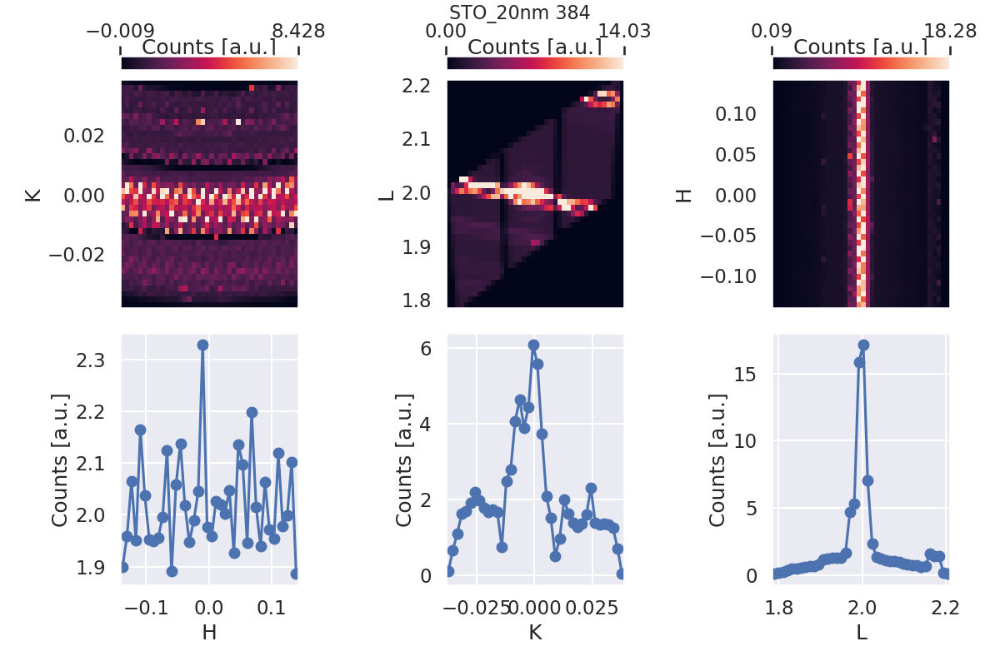

In [25]:

def plot_all(grid_data, xyz, title, bounds, HRange=None, KRange=None, LRange=None):
    HRange = HRange or bounds[0,0:2]
    KRange = KRange or bounds[1,0:2]
    LRange = LRange or bounds[2,0:2]

    [ax.cla() for ax in fig.get_axes()]

    H, K, L, data = mask_data(grid_data, xyz, HRange, KRange, LRange)
    HKL = [H, K, L]

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image,
                               vmin=np.nanpercentile(image, 2), vmax=np.nanpercentile(image, 98))

        cb = plt.colorbar(c1, ax=ax1[i], cax=caxs[i], orientation='horizontal',
                          ticks=np.linspace(*c1.get_clim(), 2))
        caxs[i].xaxis.set_ticks_position("top")

        cb.set_label('Counts [a.u.]', labelpad=-28)
        ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o')

        ax2[i].set_xlabel('{}'.format(['H', 'K', 'L'][x]))
        ax2[i].set_ylabel('Counts [a.u.]')
        ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
        
    fig.text(0.52, 0.98, title, ha='center', va='center', fontsize=16)


layout = widgets.Layout(width='30%')
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12,8), sharex='col', layout='tight')
fig.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

caxs = []
for i in range(3):
    ax1_divider = make_axes_locatable(ax1[i])
    caxs.append(ax1_divider.append_axes("top", size="6%", pad="4%"))
    fig.add_axes(caxs[-1])

key = 'STO_20nm 384'
x, y, z, intensity = rmaps[key]

bounds = [
    [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
    [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
    [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
]

Hrange, Krange, Lrange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
widgets.interact(
    plot_all, grid_data=fixed(intensity), xyz=fixed((x, y, z)), title=fixed(key), bounds=fixed(bounds),
    HRange=widgets.FloatRangeSlider(min=Hrange[0], max=Hrange[1], value=[Hrange[0], Hrange[1]], step=0.002, description='H', readout_format='.3f', layout=layout),
    KRange=widgets.FloatRangeSlider(min=Krange[0], max=Krange[1], value=[Krange[0], Krange[1]], step=0.002, description='K', readout_format='.3f', layout=layout),
    LRange=widgets.FloatRangeSlider(min=Lrange[0], max=Lrange[1], value=[Lrange[0], Lrange[1]], step=0.002, description='L', readout_format='.3f', layout=layout),
);

interactive(children=(FloatRangeSlider(value=(-0.13736958369722443, 0.13928789707104214), description='H', lay…

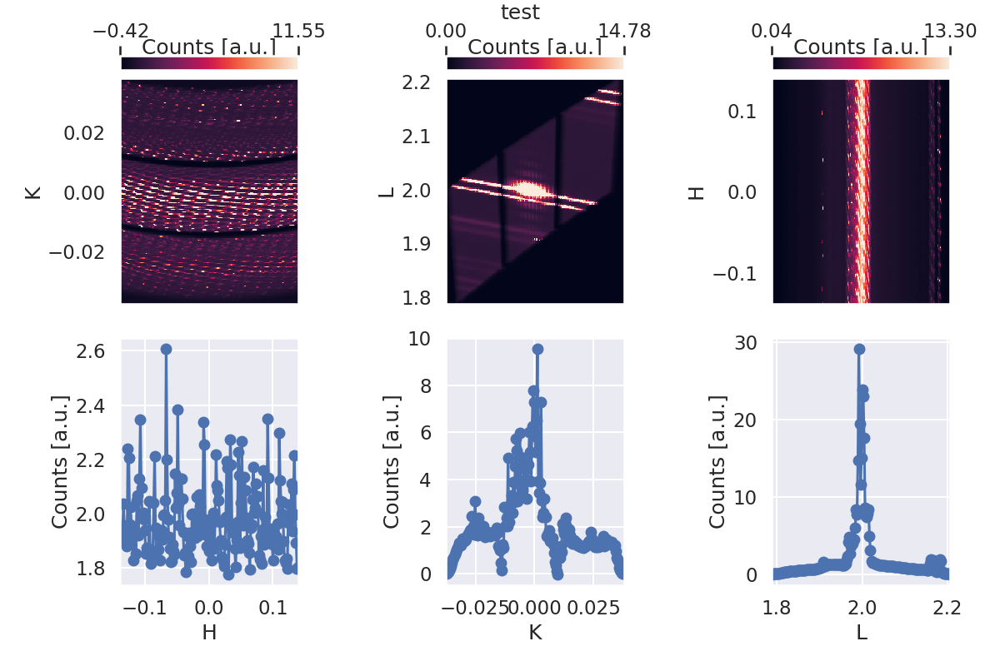

In [5]:
def mask_data(grid_data, xyz, HRange=(-np.inf, np.inf), KRange=(-np.inf, np.inf), LRange=(-np.inf, np.inf)):
    """Assign values out or range to NaN and return grid_data along with H, K, L axes"""
    H, K, L = xyz
    mask = reduce(np.logical_or, [
        H < HRange[0], H > HRange[1],
        K < KRange[0], K > KRange[1],
        L < LRange[0], L > LRange[1],
    ])
    masked_data = grid_data.copy()
    masked_data[mask] = np.NaN
    return H, K, L, masked_data


def plot_all(grid_data, xyz, title, bounds, HRange=None, KRange=None, LRange=None):
    if HRange is None: HRange = bounds[0,0:2]
    if KRange is None: KRange = bounds[1,0:2]
    if LRange is None: LRange = bounds[2,0:2]

    [ax.cla() for ax in fig.get_axes()]

    H, K, L, data = mask_data(grid_data, xyz, HRange, KRange, LRange)
    HKL = [H, K, L]

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image,
                               vmin=np.nanpercentile(image, 2), vmax=np.nanpercentile(image, 98))

        cb = plt.colorbar(c1, ax=ax1[i], cax=caxs[i], orientation='horizontal',
                          ticks=np.linspace(*c1.get_clim(), 2))
        caxs[i].xaxis.set_ticks_position("top")

        cb.set_label('Counts [a.u.]', labelpad=-28)
        ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o')

        ax2[i].set_xlabel('{}'.format(['H', 'K', 'L'][x]))
        ax2[i].set_ylabel('Counts [a.u.]')
        ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
        
    fig.text(0.52, 0.98, title, ha='center', va='center', fontsize=18)


layout = widgets.Layout(width='30%')
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12,8), sharex='col', layout='tight')
fig.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

caxs = []
for i in range(3):
    ax1_divider = make_axes_locatable(ax1[i])
    caxs.append(ax1_divider.append_axes("top", size="6%", pad="4%"))
    fig.add_axes(caxs[-1])

key = 'test'

bounds = [
    [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
    [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
    [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
]

Hrange, Krange, Lrange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
widgets.interact(
    plot_all, grid_data=fixed(intensity), xyz=fixed((x, y, z)), title=fixed(key), bounds=fixed(bounds),
    HRange=widgets.FloatRangeSlider(min=Hrange[0], max=Hrange[1], value=[Hrange[0], Hrange[1]], step=0.002, description='H', readout_format='.3f', layout=layout),
    KRange=widgets.FloatRangeSlider(min=Krange[0], max=Krange[1], value=[Krange[0], Krange[1]], step=0.002, description='K', readout_format='.3f', layout=layout),
    LRange=widgets.FloatRangeSlider(min=Lrange[0], max=Lrange[1], value=[Lrange[0], Lrange[1]], step=0.002, description='L', readout_format='.3f', layout=layout),
);

In [39]:
xu.HXRD?

Init signature: xu.HXRD(idir, ndir, geometry='hi_lo', **keyargs)
Docstring:     
class describing high angle x-ray diffraction experiments
the class helps with calculating the angles of Bragg reflections
as well as helps with analyzing measured data

the class describes a two circle (omega, twotheta) goniometer to
help with coplanar x-ray diffraction experiments. Nevertheless 3D data
can be treated with the use of linear and area detectors.
see "help(HXRDInstance.Ang2Q)"
Init docstring:
initialization routine for the HXRD Experiment class

Parameters
----------
idir, ndir, keyargs :
    same as for the Experiment base class -> please look at the
    docstring of Experiment.__init__ for more details
geometry :      {'hi_lo', 'lo_hi', 'real'}, optional
    determines the scattering geometry :

        - 'hi_lo' (default) high incidence-low exit
        - 'lo_hi' low incidence - high exit
        - 'real' general geometry - q-coordinates determine
          high or low incidence
File:    

In [ ]:
def load_stack(scan_range, img_dir, spec_file, spec_name, parallel=True):
    """
    Loads a stack of images, applying parallelization if requested.
    """
    # File naming patterns
    data_template = os.path.join(img_dir, f"checkout_{spec_name}_scan{{}}_{{:04d}}.raw")
    sf = SpecFile(str(spec_file))
    energy, UB = get_energy_UB(spec_file, scan_num)
    diff_motors = ['del', 'eta', 'phi', 'chi', 'nu', 'mu']
    angles_dict = get_angles(spec_file, scan_num, diff_motors=diff_motors, hkl_scan=False)

    # Parallel or sequential reading of image data
    def read_scan_data(scan_num):
        scan = sf[scan_num - 1]
        num_points = np.shape(scan.data)[1]
        images = [read_image(data_template.format(scan_num, i), dtype='int32', header_skip=0) for i in range(num_points)]
        return np.array(images)

    if parallel:
        with Parallel(n_jobs=min(cpu_count(), len(scan_range))) as parallel:
            scan_data = parallel(delayed(read_scan_data)(sn) for sn in scan_range)
    else:
        scan_data = [read_scan_data(sn) for sn in scan_range]

    return np.array(scan_data), energy, UB, angles_dict




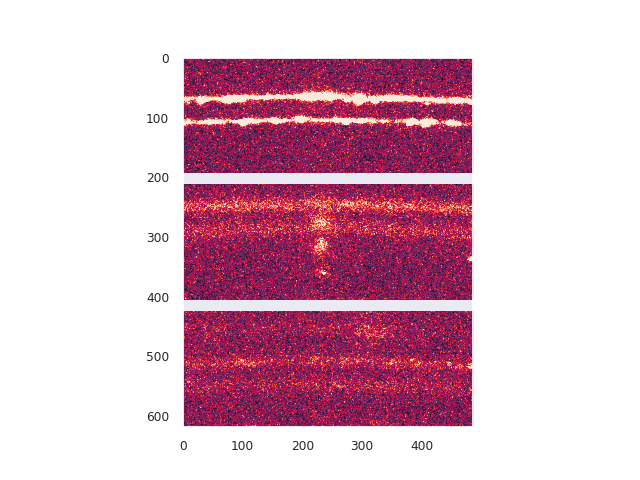

In [26]:
img_dir = Path(r'/data/bm28/inhouse/run23_3/APS/July_2023/Images/002/Cool')
sample_name = 'STO_20nm'
scan_num = 384

edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

img_arr = read_image(edf_files[0])
header = get_edf_header(edf_files[0])

header
plt.figure()
vminmax = np.nanpercentile(img_arr, (5, 95))
plt.imshow(img_arr, vmin=vminmax[0], vmax=vminmax[1])
plt.grid(False)

{
  "HeaderID": "EH:008458:000000:000000",
  "VersionNumber": "1",
  "Image": "1",
  "ByteOrder": "LowByteFirst",
  "DataType": "SignedLong",
  "Dim_1": "487",
  "Dim_2": "619",
  "Size": "1205812",
  "orientation": "1",
  "beam_y": "307",
  "beam_x": "230",
  "pixel_size_y": "0.172",
  "pixel_size_x": "0.172",
  "detector_distance": "1210",
  "pointno": "0",
  "scanno": "384",
  "specfile": "/data/bm28/inhouse/run23_3/APS/July_2023/STO_membrane_psic.01",
  "cnt_col_end": "0",
  "cnt_col_beg": "0",
  "cnt_row_end": "0",
  "cnt_row_beg": "0",
  "source_wavelength": "1.23984",
  "Q_pos": "0.00175609 -0.000839033 1.90049 1.23984 -72.4148 72.4654 -0.271437 35.1199",
  "Q_mne": "Q0 Q1 Q2 Q3 Q4 Q5 Q6 Q7",
  "sample_pos": "3.905 3.905 3.905 90 90 90",
  "sample_mne": "U0 U1 U2 U3 U4 U5",
  "UB_pos": "-1.13377 -1.14163 -0.0125601 1.14166 -1.13381 0.000821833 -0.00943377 -0.00833283 1.60896",
  "UB_mne": "UB0 UB1 UB2 UB3 UB4 UB5 UB6 UB7 UB8",
  "time": "1690481730.0032830238",
  "offset": "0",


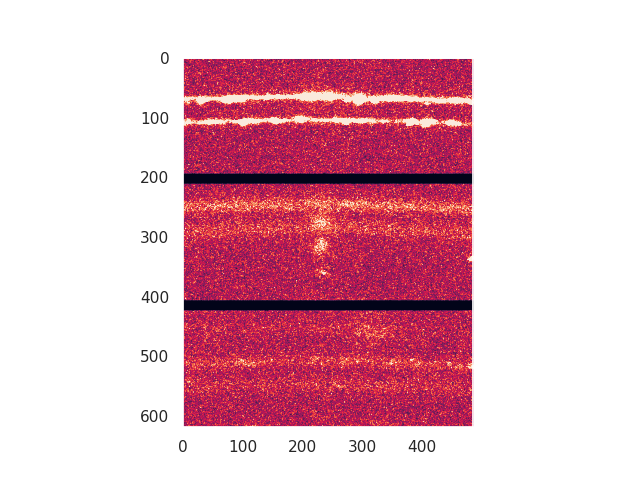

In [38]:
motors = {k:float(v) for k, v in zip(headers[0]['motor_mne'].split(), headers[0]['motor_pos'].split())}
counters = {k:float(v) for k, v in zip(headers[0]['counter_mne'].split(), headers[0]['counter_pos'].split())}
headers[0]

{
  "HeaderID": "EH:008458:000000:000000",
  "VersionNumber": "1",
  "Image": "1",
  "ByteOrder": "LowByteFirst",
  "DataType": "SignedLong",
  "Dim_1": "487",
  "Dim_2": "619",
  "Size": "1205812",
  "orientation": "1",
  "beam_y": "307",
  "beam_x": "230",
  "pixel_size_y": "0.172",
  "pixel_size_x": "0.172",
  "detector_distance": "1210",
  "pointno": "0",
  "scanno": "384",
  "specfile": "/data/bm28/inhouse/run23_3/APS/July_2023/STO_membrane_psic.01",
  "cnt_col_end": "0",
  "cnt_col_beg": "0",
  "cnt_row_end": "0",
  "cnt_row_beg": "0",
  "source_wavelength": "1.23984",
  "Q_pos": "0.00175609 -0.000839033 1.90049 1.23984 -72.4148 72.4654 -0.271437 35.1199",
  "Q_mne": "Q0 Q1 Q2 Q3 Q4 Q5 Q6 Q7",
  "sample_pos": "3.905 3.905 3.905 90 90 90",
  "sample_mne": "U0 U1 U2 U3 U4 U5",
  "UB_pos": "-1.13377 -1.14163 -0.0125601 1.14166 -1.13381 0.000821833 -0.00943377 -0.00833283 1.60896",
  "UB_mne": "UB0 UB1 UB2 UB3 UB4 UB5 UB6 UB7 UB8",
  "time": "1690481730.0032830238",
  "offset": "0",


In [100]:
img_dir = Path(r'/data/bm28/inhouse/run23_3/APS/July_2023/Images/002/Cool')
sample_name = 'STO_20nm'
scan_num = 384

# Parallel or sequential reading of image data
def read_scan_data(edf_file, angles_dict):
    header = get_edf_header(edf_file)
    motors = {k:float(v) for k, v in zip(header['motor_mne'].split(), header['motor_pos'].split())}
    counters = {k:float(v) for k, v in zip(header['counter_mne'].split(), header['counter_pos'].split())}

    for dm in angles_dict.keys():
        angles_dict[dm].append(motors[dm])
    
    return read_image(edf_file)


def load_stack(img_dir, sample_name, scan_num, parallel=True):
    """
    Loads a stack of images, applying parallelization if requested.
    """
    # File naming patterns
    edf_files = natsorted(list(img_dir.glob(f'{sample_name}_[0-9][0-9][0-9][0-9]_{scan_num:04d}_[0-9][0-9][0-9].edf')))

    # Get energy and UB matric
    header = get_edf_header(edf_files[0])
    energy = 12.398 / float(header['source_wavelength']) * 1e3
    #UB = [float(i) for i in header['UB_pos'].split()]
    UB = np.array(header['UB_pos'].split()).astype(float).reshape(3,3)

    diff_motors = ['del', 'eta', 'phi', 'chi', 'nu', 'mu']
    angles_dict = {dm:[] for dm in diff_motors}

    if parallel:
        with Parallel(n_jobs=min(cpu_count(), len(edf_files))) as parallel:
            scan_data = parallel(delayed(read_scan_data)(f, angles_dict) for f in edf_files)
    else:
        scan_data = [read_scan_data(f, angles_dict) for f in edf_files]

    return np.array(scan_data), energy, UB, angles_dict, header

img, energy, UB, angles, header = load_stack(img_dir, sample_name, scan_num, parallel=False)

In [99]:
x-', 'z-', cch1=db_pixel[0], cch2=db_pixel[1], 
                         Nch1=487, Nch2=195, pwidth1=pix_size, pwidth2=pix_size, distance=distance)

Nch1, Nch2 = header['Dim_1'], header['Dim_2']
cch1, cch2 = header['beam_x'], header['beam_y']
pwidth1, pwidth2 = header['pixel_size_x'], header['pixel_size_y']
distance = header['detector_distance']

{
  "HeaderID": "EH:008458:000000:000000",
  "VersionNumber": "1",
  "Image": "1",
  "ByteOrder": "LowByteFirst",
  "DataType": "SignedLong",
  "Dim_1": "487",
  "Dim_2": "619",
  "Size": "1205812",
  "orientation": "1",
  "beam_y": "307",
  "beam_x": "230",
  "pixel_size_y": "0.172",
  "pixel_size_x": "0.172",
  "detector_distance": "1210",
  "pointno": "0",
  "scanno": "384",
  "specfile": "/data/bm28/inhouse/run23_3/APS/July_2023/STO_membrane_psic.01",
  "cnt_col_end": "0",
  "cnt_col_beg": "0",
  "cnt_row_end": "0",
  "cnt_row_beg": "0",
  "source_wavelength": "1.23984",
  "Q_pos": "0.00175609 -0.000839033 1.90049 1.23984 -72.4148 72.4654 -0.271437 35.1199",
  "Q_mne": "Q0 Q1 Q2 Q3 Q4 Q5 Q6 Q7",
  "sample_pos": "3.905 3.905 3.905 90 90 90",
  "sample_mne": "U0 U1 U2 U3 U4 U5",
  "UB_pos": "-1.13377 -1.14163 -0.0125601 1.14166 -1.13381 0.000821833 -0.00943377 -0.00833283 1.60896",
  "UB_mne": "UB0 UB1 UB2 UB3 UB4 UB5 UB6 UB7 UB8",
  "time": "1690481730.0032830238",
  "offset": "0",


In [102]:
def grid_img_data(img, energy, UB, angles_dict, header):
    """
    Maps image data to reciprocal space, using a gridder for binning.
    """
    qconversion = xu.QConversion(['z-', 'y+', 'z-'], ['z-'], [0, 1, 0])
    hxrd = xu.HXRD([0, 1, 0], [0, 0, 1], en=energy, qconv=qconversion)

    Nch1, Nch2 = header['Dim_1'], header['Dim_2']
    cch1, cch2 = header['beam_x'], header['beam_y']
    pwidth1, pwidth2 = header['pixel_size_x'], header['pixel_size_y']
    distance = header['detector_distance']
    
    hxrd.Ang2Q.init_area('x-', 'z-', cch1=cch1, cch2=cch2, 
                         Nch1=Nch1, Nch2=Nch2, pwidth1=pwidth1, pwidth2=pwidth2, distance=distance)

    angle_values = [angles_dict[motor] for motor in ['eta', 'chi', 'phi', 'del']]
    qx, qy, qz = hxrd.Ang2Q.area(*angle_values, UB=UB)
    print(qx.shape)

    gridder = xu.Gridder3D(200, 200, 200)
    gridder(qx, qy, qz, img)
    return gridder.xaxis, gridder.yaxis, gridder.zaxis, gridder.data.astype(float)

x, y, z, intensity = grid_img_data(img, energy, UB, angles, header)

(151, 487, 619)


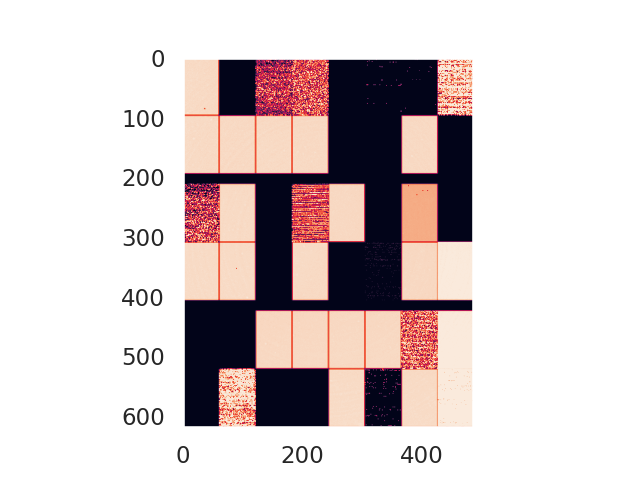

In [32]:
plt.figure()

img_arr = edf_f.data
vminmax = np.nanpercentile(img_arr, (5, 95))
plt.imshow(img_arr, vmin=vminmax[0], vmax=vminmax[1])
plt.grid(False)

interactive(children=(FloatRangeSlider(value=(1.83874945048235, 2.15070981552051), description='H', layout=Lay…

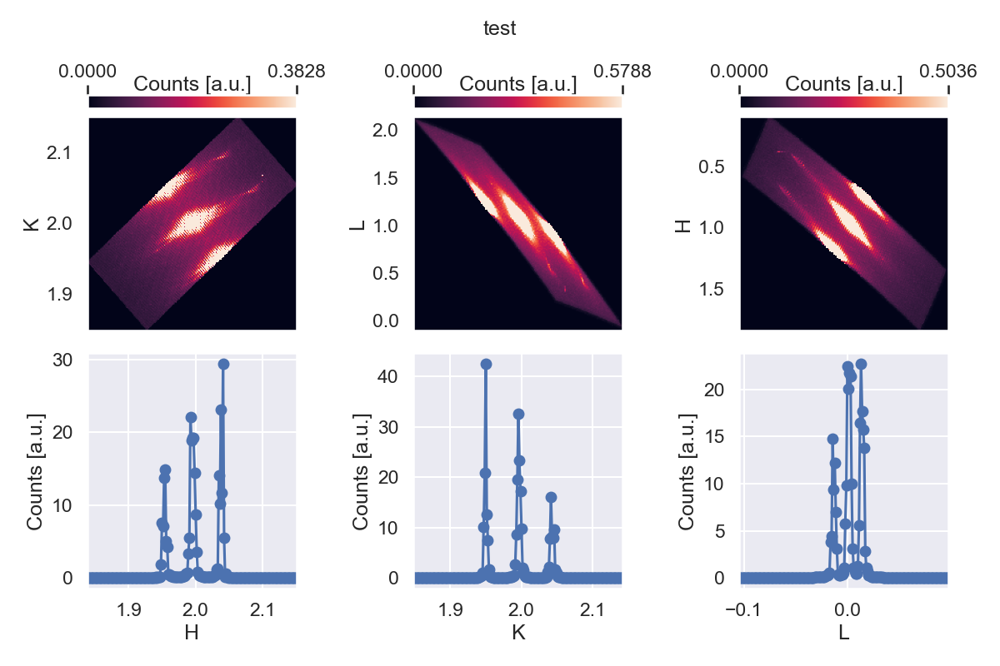

In [49]:
def mask_data(grid_data, xyz, HRange=(-np.inf, np.inf), KRange=(-np.inf, np.inf), LRange=(-np.inf, np.inf)):
    """Assign values out or range to NaN and return grid_data along with H, K, L axes"""
    H, K, L = xyz
    H_inds = (H >= HRange[0]) & (H <= HRange[1])
    K_inds = (K >= KRange[0]) & (K <= KRange[1])
    L_inds = (L >= LRange[0]) & (L <= LRange[1])
    
    return H[H_inds], K[K_inds], L[L_inds], grid_data[H_inds,:,:][:,K_inds,:][:,:,L_inds]


def plot_all(grid_data, xyz, title, bounds, HRange=None, KRange=None, LRange=None):
    HRange = HRange or bounds[0,0:2]
    KRange = KRange or bounds[1,0:2]
    LRange = LRange or bounds[2,0:2]

    [ax.cla() for ax in fig.get_axes()]

    H, K, L, data = mask_data(grid_data, xyz, HRange, KRange, LRange)
    HKL = [H, K, L]

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3

        image = np.nanmean(data, axis=integrate)
        if x < y: image = image.T

        vminmax = np.nanpercentile(image, (2, 98))
        #c1 = ax1[i].pcolormesh(HKL[x], HKL[y], image,
        #                   vmin=vminmax[0], vmax=vminmax[1])
        c1 = ax1[i].imshow(image, extent = (HKL[x][0], HKL[x][-1], HKL[y][0], HKL[x][-1]),
                           vmin=vminmax[0], vmax=vminmax[1], origin='lower', aspect='auto')
        ax1[i].grid(False)

        cb = plt.colorbar(c1, ax=ax1[i], cax=caxs[i], orientation='horizontal',
                          ticks=np.linspace(*c1.get_clim(), 2))
        caxs[i].xaxis.set_ticks_position("top")

        cb.set_label('Counts [a.u.]', labelpad=-28)
        ax2[i].plot(HKL[x], np.nanmean(image, axis=0), '-o')

        ax2[i].set_xlabel('{}'.format(['H', 'K', 'L'][x]))
        ax2[i].set_ylabel('Counts [a.u.]')
        ax1[i].set_ylabel('{}'.format(['H', 'K', 'L'][y]))
        
    fig.suptitle(title, fontsize=18, y=0.97)


#style = {'description_width': 'initial'}
layout = widgets.Layout(width='30%')
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, figsize=(12,8), sharex='col', layout='tight')
fig.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

caxs = []
for i in range(3):
    ax1_divider = make_axes_locatable(ax1[i])
    caxs.append(ax1_divider.append_axes("top", size="6%", pad="4%"))
    fig.add_axes(caxs[-1])

key = 'test'

h_min, h_max = np.min(x), np.max(x)
k_min, k_max = np.min(y), np.max(y)
l_min, l_max = np.min(z), np.max(z)

bounds = [
    [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
    [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
    [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
]

Hrange, Krange, Lrange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
widgets.interact(
    plot_all, grid_data=fixed(intensity), xyz=fixed((x, y, z)), title=fixed(key), bounds=fixed(bounds),
    HRange=widgets.FloatRangeSlider(min=Hrange[0], max=Hrange[1], value=[Hrange[0], Hrange[1]], step=0.002, description='H', readout_format='.3f', layout=layout),
    KRange=widgets.FloatRangeSlider(min=Krange[0], max=Krange[1], value=[Krange[0], Krange[1]], step=0.002, description='K', readout_format='.3f', layout=layout),
    LRange=widgets.FloatRangeSlider(min=Lrange[0], max=Lrange[1], value=[Lrange[0], Lrange[1]], step=0.002, description='L', readout_format='.3f', layout=layout),
);

interactive(children=(FloatRangeSlider(value=(1.83874945048235, 2.15070981552051), description='H', layout=Lay…

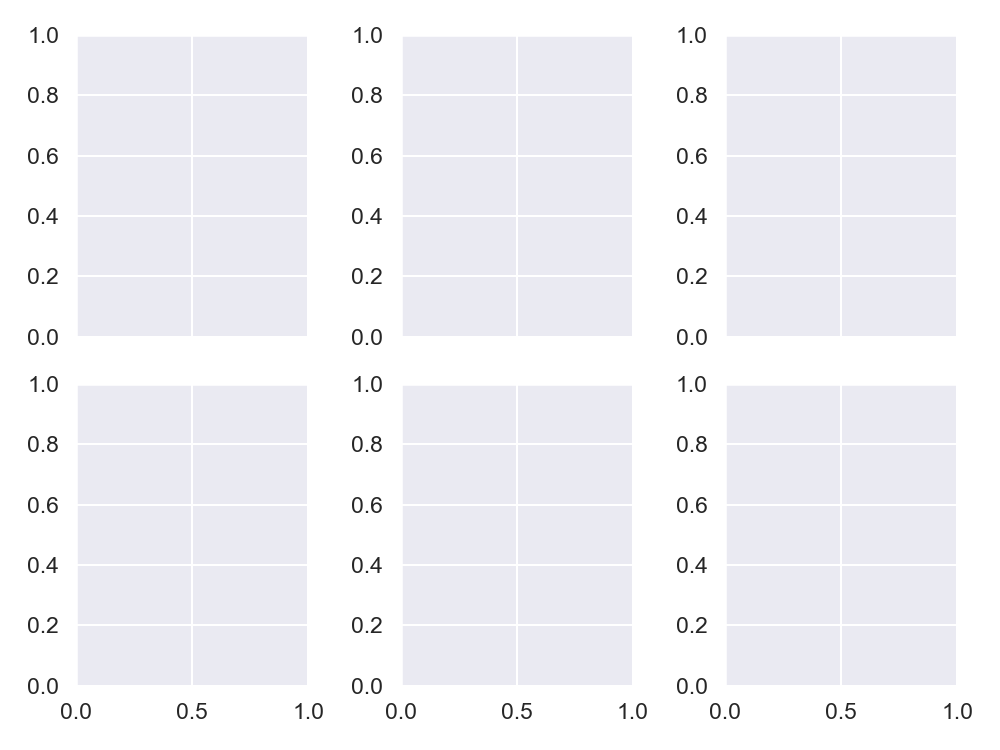

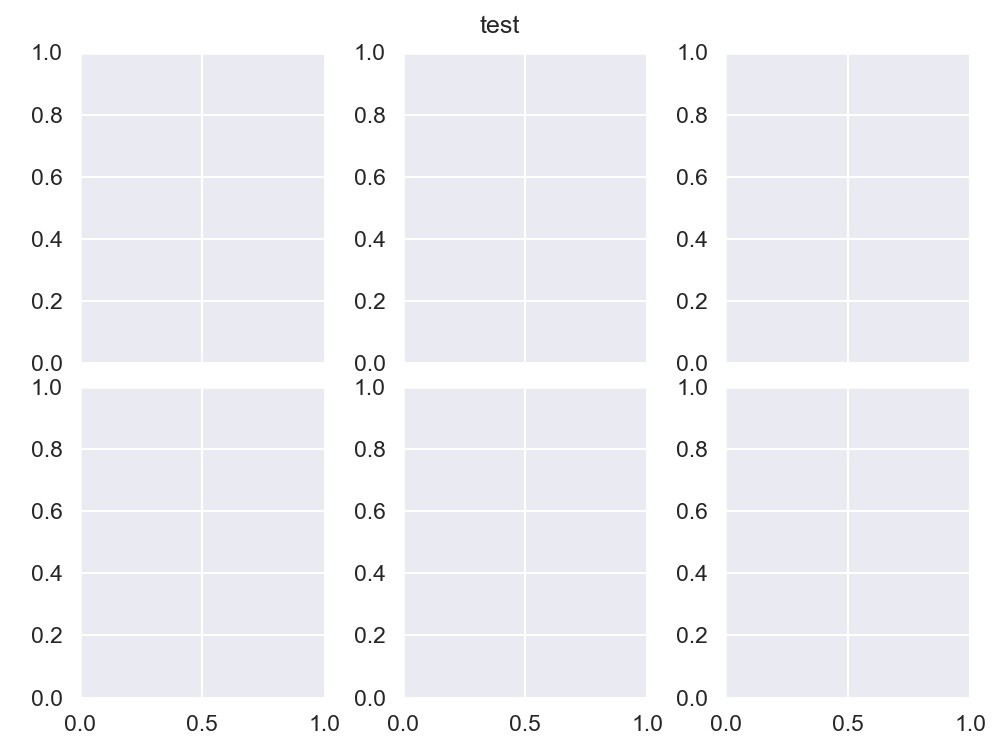

In [6]:
def mask_data(grid_data, xyz, bounds, HRange, KRange, LRange):
    """Mask data outside specified ranges and return H, K, L axes."""
    H, K, L = xyz
    mask = reduce(np.logical_or, [
        H < HRange[0], H > HRange[1],
        K < KRange[0], K > KRange[1],
        L < LRange[0], L > LRange[1],
    ])
    masked_data = grid_data.copy()
    masked_data[mask] = np.NaN
    return H, K, L, masked_data


def plot_all(grid_data, xyz, title, bounds, HRange, KRange, LRange):
    """Create 2D plots with projections and colorbars."""
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, figsize=(10, 7.5), sharex='col')
    fig.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)
    fig.suptitle(title, fontsize=18, y=0.98)  # Title position adjustment

    H, K, L, data = mask_data(grid_data, xyz, bounds, HRange, KRange, LRange)

    for i in range(3):
        x, y, integrate = i, (i + 1) % 3, (i + 2) % 3  # Axes indices
        image = np.nanmean(data, axis=integrate).T if x < y else np.nanmean(data, axis=integrate)

        im = ax1[i].pcolormesh(H[x], H[y], image,
                               vmin=np.nanpercentile(image, 2), vmax=np.nanpercentile(image, 98))

        fig.colorbar(im, ax=ax1[i], label='Counts [a.u.]', shrink=0.8)  # Add Colorbar

        ax2[i].plot(H[x], np.nanmean(image, axis=0), '-o')
        ax2[i].set_xlabel(['H', 'K', 'L'][x])
        ax2[i].set_ylabel('Counts [a.u.]')
        ax1[i].set_ylabel(['H', 'K', 'L'][y]) 


#style = {'description_width': 'initial'}
layout=widgets.Layout(width='30%')
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=3, figsize=(10,7.5), sharex='col', layout='tight')
fig.subplots_adjust(left=0.08, right=0.97, bottom=0.07, top=0.93, hspace=0.08, wspace=0.32)

##for i in range(3):
#    ax1_divider = make_axes_locatable(ax1[i])
#    cax = ax1_divider.append_axes("top", size="6%", pad="4%")
#    fig.add_axes(cax)

key = 'test'

h_min, h_max = np.min(x), np.max(x)
k_min, k_max = np.min(y), np.max(y)
l_min, l_max = np.min(z), np.max(z)

bounds = [
    [np.min(x), np.max(x), (np.max(x) - np.min(x))/x.shape[0]],
    [np.min(y), np.max(y), (np.max(y) - np.min(y))/y.shape[0]],
    [np.min(z), np.max(z), (np.max(z) - np.min(z))/z.shape[0]]
]

Hrange, Krange, Lrange = [[row[0], row[1], (row[1]-row[0])/row[2]] for row in bounds]
widgets.interact(
    plot_all, grid_data=fixed(intensity), xyz=fixed((x, y, z)), title=fixed(key), bounds=fixed(bounds),
    HRange=widgets.FloatRangeSlider(min=Hrange[0], max=Hrange[1], value=[Hrange[0], Hrange[1]], step=0.002, description='H', readout_format='.3f', layout=layout),
    KRange=widgets.FloatRangeSlider(min=Krange[0], max=Krange[1], value=[Krange[0], Krange[1]], step=0.002, description='K', readout_format='.3f', layout=layout),
    LRange=widgets.FloatRangeSlider(min=Lrange[0], max=Lrange[1], value=[Lrange[0], Lrange[1]], step=0.002, description='L', readout_format='.3f', layout=layout),
);